# LendingClub data - accepted & rejected loans

Machine Learning module / Project 3 @TuringCollege

## Intro

LendingClub is a peer-to-peer lending company that matches borrowers with investors through an online platform. It services people that need personal loans between $\$$1,000 and $\$$40,000. On the basis of the borrower’s credit score, credit history, desired loan amount and the borrower’s debt-to-income ratio, LendingClub determines whether the borrower is creditworthy and assigns to its approved loans a credit grade that determines the payable interest rate and fees. Most borrowers are approved for their loan in 24 hours and receive their money from LendingClub within two days.

In 2020, LendingClub acquired Radius Bank and closed its peer-to-peer lending platform.

### Structure

LendingClub data contains customer (borrower) and loan information for accepted loans as well as for rejected loan applications over the period ranging from 2007 to 2018 (including). Data is distributed into two files:

- Accepted loan dataset contains more than 2M observations (customers) and has 151 features related with borrower personal and financial information, credit rating and credit history, current loan status, payment details, etc.
- Rejected loan dataset has more than 27M observations (customers) and only 9 features: application date, amount requested, loan purpose, policy code, borrower risk (fico) score and debt-to-income ratio, state, zip code and employment length.

The period chosen for this project is **from 2017 to 2018 (including)**.

### Approach

- Based on the project requirements there are 4 ML goals:
    1. classify loan applications into accepted or rejected
    1. predict the grade for the loan
    1. predict the sub-grade for the loan
    1. predict interest rate for the loan

Because ML targets are related with loan application and loan initialization after approval (steps that are done before issuing the loan to borrower) and not with the loan performance or repayment, EDA is structured accordingly: choosing and analyzing features that are related with loan application process and initial loan preprocessing after approval.

- The first part of EDA is focused on investigating and validating each feature impact on distinguishing loan application as accepted or rejected. 
- In the second part of EDA, loan grade, sub-grade and interest rate are explored and analyzed to understand feature importance and data relationships/associations. In order not to expand too much, this part has not been analyzed in detail.
- ML goal is to develop and analyze prediction algorithms for each target and explore model-based feature importance.
- Final step is to combine EDA and ML findings in order to choose and deploy best performing ML models as per project requirements

**Note:** In order to minimize the scope of this notebook, ML is performed in a separate notebook.

#### References

- https://help.lendingclub.com/hc/en-us/categories/202532278-Personal-Loans
- https://help.lendingclub.com/hc/en-us/categories/202526357-General-Help-and-Information
- https://en.wikipedia.org/wiki/LendingClub

## Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
import seaborn as sns
import plotly.express as px

from functions import *

plt.rcParams["figure.dpi"] = 200
custom_palette = [
    "#124984",
    "#5fa5cd",
    "#a7d0e4",
    "#dd7059",
    "#d25849",
    "#ae172a",
    "#8a0b25",
]
primary_light_color = "#5699bf"
sns.set_palette(custom_palette)

### Accepted loans 

In [2]:
accepted_full = pd.read_csv("accepted_2007_to_2018Q4.csv", low_memory=False)

In [3]:
accepted_full["issue_d"] = pd.to_datetime(accepted_full["issue_d"], format="%b-%Y")

accepted = accepted_full[accepted_full["issue_d"].dt.year >= 2017]

In [4]:
accepted.shape

(938821, 151)

In [5]:
print(
    "2017-2018 data acounts for "
    + str(round(accepted.shape[0] * 100 / accepted_full.shape[0], 2))
    + "% of the data in accepted loan dataset.",
)

2017-2018 data acounts for 41.53% of the data in accepted loan dataset.


### Rejected loans

In [6]:
rejected_full = pd.read_csv("rejected_2007_to_2018Q4.csv", low_memory=False)

In [7]:
rejected_full["Application Date"] = pd.to_datetime(
    rejected_full["Application Date"], format="%Y-%m-%d"
)

rejected = rejected_full[rejected_full["Application Date"].dt.year >= 2017]

In [8]:
rejected.shape

(16569355, 9)

In [9]:
print(
    "2017-2018 data acounts for "
    + str(round(rejected.shape[0] * 100 / rejected_full.shape[0], 2))
    + "% of the data in rejected loan dataset.",
)

2017-2018 data acounts for 59.93% of the data in rejected loan dataset.


## Accepted loans - data exploration & cleaning

In [10]:
accepted.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,hardship_payoff_balance_amount,hardship_last_payment_amount,disbursement_method,debt_settlement_flag,debt_settlement_flag_date,settlement_status,settlement_date,settlement_amount,settlement_percentage,settlement_term
421097,130954621,NaN,5000.0,5000.0,5000.0,36 months,20.39,186.82,D,D4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
421098,130964697,NaN,15000.0,15000.0,15000.0,36 months,9.92,483.45,B,B2,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
421099,130955326,NaN,11200.0,11200.0,11200.0,60 months,30.79,367.82,G,G1,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
421100,130504052,NaN,25000.0,25000.0,25000.0,60 months,21.85,688.35,D,D5,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN
421101,130956066,NaN,3000.0,3000.0,3000.0,36 months,7.34,93.10,A,A4,...,NaN,NaN,Cash,N,NaN,NaN,NaN,NaN,NaN,NaN


**Insights**

In relation with ML targets, EDA is focused on investigating and validating features that are related with loan application process and initial loan preprocessing after approval.

After several iterations of analysis, I have chosen features for EDA from dataframe of accepted loans that provide the most information and have strongest associations with loan application status (accepted/rejected), loan grade, sub-grade and interest rate.

In [11]:
cols_to_keep = [
    "loan_amnt",
    "funded_amnt",
    "term",
    "int_rate",
    "grade",
    "sub_grade",
    "emp_title",
    "emp_length",
    "home_ownership",
    "annual_inc",
    "issue_d",
    "title",
    "addr_state",
    "dti",
    "delinq_2yrs",
    "earliest_cr_line",
    "fico_range_low",
    "fico_range_high",
    "inq_last_6mths",
    "open_acc",
    "total_acc",
    "application_type",
    "pub_rec",
    "pub_rec_bankruptcies",
    "policy_code",
]

accepted = accepted[cols_to_keep].copy()

In [12]:
cols_to_lower = ["home_ownership", "emp_title", "title", "application_type"]

for col in cols_to_lower:
    accepted[col] = accepted[col].str.lower().str.strip().replace(" ", "_", regex=True)

In [13]:
accepted.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 938821 entries, 421097 to 2157150
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             938821 non-null  float64       
 1   funded_amnt           938821 non-null  float64       
 2   term                  938821 non-null  object        
 3   int_rate              938821 non-null  float64       
 4   grade                 938821 non-null  object        
 5   sub_grade             938821 non-null  object        
 6   emp_title             851818 non-null  object        
 7   emp_length            864963 non-null  object        
 8   home_ownership        938821 non-null  object        
 9   annual_inc            938821 non-null  float64       
 10  issue_d               938821 non-null  datetime64[ns]
 11  title                 938821 non-null  object        
 12  addr_state            938821 non-null  object       

### Missing values

In [14]:
accepted_missing = (
    (accepted.isnull().sum() * 100 / len(accepted))
    .to_frame()
    .rename(columns={0: "percent_missing"})
    .round(2)
)

In [15]:
accepted_missing.sort_values(by="percent_missing", ascending=False)

,percent_missing
emp_title,9.27
emp_length,7.87
dti,0.18
loan_amnt,0.00
delinq_2yrs,0.00
pub_rec_bankruptcies,0.00
pub_rec,0.00
application_type,0.00
total_acc,0.00
open_acc,0.00


In [16]:
accepted["emp_length"] = accepted["emp_length"].fillna("not_provided")
accepted["emp_title"] = accepted["emp_title"].fillna("not_provided")

**Insights**

- Selected columns from accepted loan dataframe have very little missing values. 
- Missing values for `emp_length` and `emp_title` columns were replaced with string 'not_provided'.
- Missing values for `dti` column is going to be handled after analysing descriptive statistics.

### Duplicates

In [17]:
accepted[accepted.duplicated()].count()

loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
issue_d                 0
title                   0
addr_state              0
dti                     0
delinq_2yrs             0
earliest_cr_line        0
fico_range_low          0
fico_range_high         0
inq_last_6mths          0
open_acc                0
total_acc               0
application_type        0
pub_rec                 0
pub_rec_bankruptcies    0
policy_code             0
dtype: int64

**Insight**

No duplicates detected.

### Descriptive statistics

**LendingClub requirements to get a loan:**
- personal loans between $\$$1,000 and $\$$40,000
- fico (risk) score should be good (660–739) or excellent (800 and above). Some applications could be accepted with medium (fair) fico score but not lower than 600
- debt-to-income (dti) ratio under 40%

In [18]:
accepted.describe().round(1)[['loan_amnt', 'funded_amnt', 'fico_range_low', 'fico_range_high', 'dti', 'annual_inc']]

,loan_amnt,funded_amnt,fico_range_low,fico_range_high,dti,annual_inc
count,938821.0,938821.0,938821.0,938821.0,937175.0,938821.0
mean,15467.5,15467.5,703.5,707.5,19.5,80099.5
std,9920.0,9920.0,35.3,35.3,19.2,154433.4
min,1000.0,1000.0,660.0,664.0,-1.0,0.0
25%,8000.0,8000.0,675.0,679.0,11.7,46000.0
50%,12975.0,12975.0,695.0,699.0,17.8,66000.0
75%,20375.0,20375.0,725.0,729.0,24.9,96000.0
max,40000.0,40000.0,845.0,850.0,999.0,110000000.0


In [19]:
accepted.describe(include="object")

,term,grade,sub_grade,emp_title,emp_length,home_ownership,title,addr_state,earliest_cr_line,application_type
count,938821,938821,938821,938821,938821,938821,938821,938821,938821,938821
unique,2,7,35,161673,12,5,13,50,710,2
top,36 months,B,C1,not_provided,10+ years,mortgage,debt_consolidation,CA,Aug-2006,individual
freq,665090,274492,60934,87003,306439,456343,504723,127118,7719,827411


In [20]:
accepted.groupby("application_type")["dti"].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
application_type,,,,,,,,
individual,827411.0,17.78,8.47,0.0,11.40,17.27,23.80,39.99
joint_app,109764.0,32.15,49.08,-1.0,15.24,25.00,37.32,999.00


In [21]:
accepted.groupby("application_type")["annual_inc"].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
application_type,,,,,,,,
individual,827411.0,82786.25,163134.26,1900.0,49000.0,70000.0,100000.0,110000000.0
joint_app,111410.0,60145.40,53638.32,0.0,35000.0,51700.0,75000.0,6240000.0


In [22]:
accepted = accepted.drop(accepted[accepted["application_type"] == "joint_app"].index)
accepted = accepted.drop(columns=["application_type"])

In [23]:
accepted["policy_code"].unique()

array([1.])

In [24]:
accepted = accepted.drop(columns=["policy_code"])

In [25]:
accepted["fico_score"] = accepted[["fico_range_low", "fico_range_high"]].mean(axis=1)
accepted = accepted.drop(columns=["fico_range_low", "fico_range_high"])

In [26]:
accepted.isnull().sum()

loan_amnt               0
funded_amnt             0
term                    0
int_rate                0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
issue_d                 0
title                   0
addr_state              0
dti                     0
delinq_2yrs             0
earliest_cr_line        0
inq_last_6mths          0
open_acc                0
total_acc               0
pub_rec                 0
pub_rec_bankruptcies    0
fico_score              0
dtype: int64

**Findings**
- Descriptive statistics reveals some deviations (in `annual_inc` and `dti` columns) from the LendingClub norms. Analysis shows that these deviations occur because of joint applications - probably co-borrower metrics could be outside the regular norms or not provided at all.
- Because there is no application type data in rejected file (meaning that there is no way to identify if loan application is joint or individual), I decided to delete all joint applications from accepted loans dataset as different standards/thresholds are applied and it may misrepresent data (especially difference between rejected and accepted loans). 
- All the loan applications in rejected dataset will be treated as individual.
- Joint accounts could be analyzed separately and accordingly a different algorithm for predictions should be created.

Reference: https://www.lendacademy.com/joint-application-lending-club-loans/

- `policy_code` has only one value therefore the column was dropped.
- The new column was added representing the mean of fico score ranges as in rejected loan dataset.

### Outliers

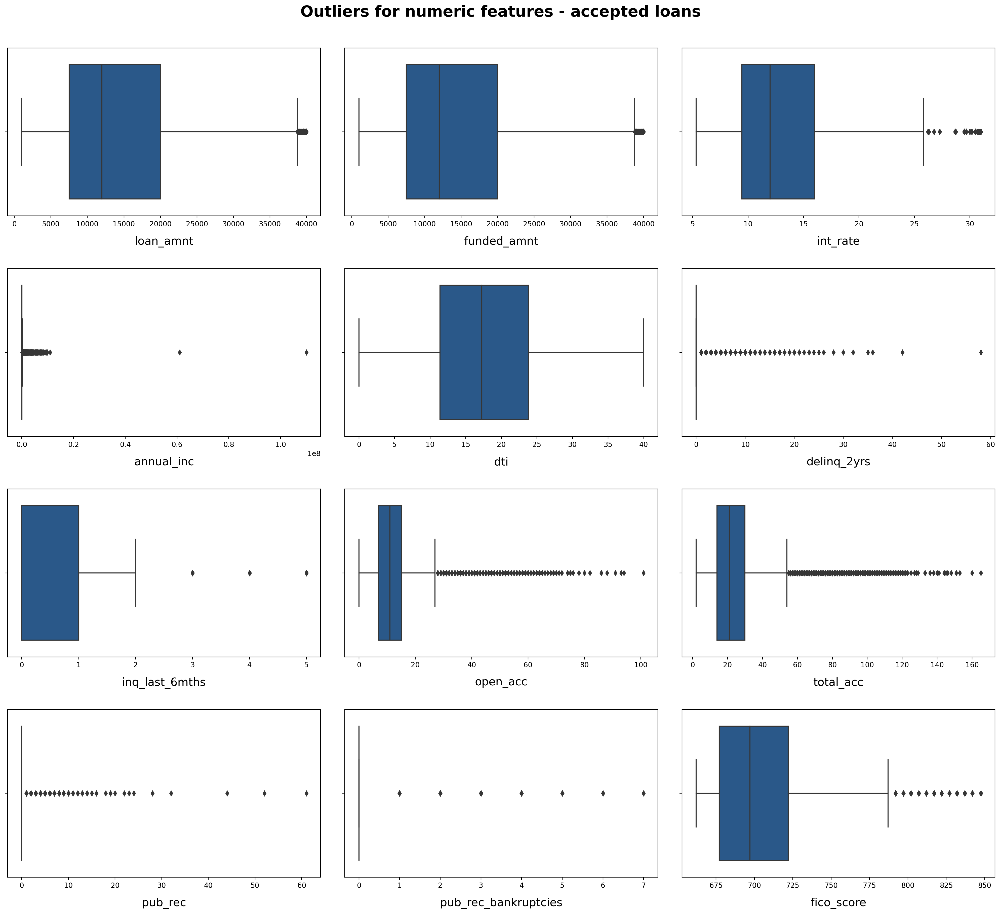

In [27]:
fig = plt.figure(figsize=(20, 26))

numeric_cols = accepted.select_dtypes("float64").columns

fig.suptitle(
    "Outliers for numeric features - accepted loans",
    fontsize=22,
    fontweight="semibold",
    y=1.01,
)

for i, column in enumerate(numeric_cols, 1):
    ax = plt.subplot(6, 3, i)
    sns.boxplot(x=accepted[column], color="#1a5899")
    ax.set_xlabel(column, labelpad=12, fontdict={"fontsize": 16})

plt.tight_layout(h_pad=3, w_pad=3)
plt.show()

**Insights**

Almost all numeric features have some outliers onhigher end. But after deleting joint applications, numeric data is in accordance with LendingClub requirements and norms, therefore outliers are not removed as they are an important part of the analysis.

## Rejected loans - data exploration & cleaning

In [28]:
rejected.head()

,Amount Requested,Application Date,Loan Title,Risk_Score,Debt-To-Income Ratio,Zip Code,State,Employment Length,Policy Code
3024671,20000.0,2017-01-01,debt_consolidation,NaN,0%,316xx,GA,NaN,0.0
3024672,15000.0,2017-01-01,home_improvement,NaN,0.58%,190xx,PA,< 1 year,0.0
3024673,1000.0,2017-01-01,Debt consolidation,528.0,0%,775xx,TX,< 1 year,0.0
3024674,2500.0,2017-01-01,car,NaN,1.7%,199xx,DE,5 years,0.0
3024675,6000.0,2017-01-01,credit_card,NaN,2.93%,761xx,TX,5 years,0.0


In [29]:
rejected.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16569355 entries, 3024671 to 26244250
Data columns (total 9 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Amount Requested      float64       
 1   Application Date      datetime64[ns]
 2   Loan Title            object        
 3   Risk_Score            float64       
 4   Debt-To-Income Ratio  object        
 5   Zip Code              object        
 6   State                 object        
 7   Employment Length     object        
 8   Policy Code           float64       
dtypes: datetime64[ns](1), float64(3), object(5)
memory usage: 1.2+ GB


In [30]:
rejected.columns = pd.Series(rejected.columns).apply(convert_col_name)
rejected = rejected.rename(columns={"debt-to-income_ratio": "dti_ratio"})
rejected["dti_ratio"] = rejected["dti_ratio"].str.replace("%", "")
rejected["dti_ratio"] = pd.to_numeric(rejected["dti_ratio"])
rejected["loan_title"] = (
    rejected["loan_title"].str.lower().str.strip().replace(" ", "_", regex=True)
)

### Missing values

In [31]:
rejected.isnull().sum()

amount_requested            0
application_date            0
loan_title               1098
risk_score           12094851
dti_ratio                   0
zip_code                    2
state                       0
employment_length      596490
policy_code               918
dtype: int64

In [32]:
rejected["employment_length"] = rejected["employment_length"].fillna("not_provided")
rejected["loan_title"] = rejected["loan_title"].fillna("not_provided")

**Missing FICO score by year**

In [33]:
rejected_fico_by_year = rejected_full.groupby(
    rejected_full["Application Date"].dt.year
).agg(fico_count=("Risk_Score", "count"), total_count=("Application Date", "count"))
rejected_fico_by_year["%_of_missing_fico"] = 100 - (
    rejected_fico_by_year["fico_count"] * 100 / rejected_fico_by_year["total_count"]
)

rejected_fico_by_year.round(2)

,fico_count,total_count,%_of_missing_fico
Application Date,,,
2007,5170,5274,1.97
2008,23090,25596,9.79
2009,50765,56991,10.92
2010,104584,112561,7.09
2011,215014,217792,1.28
2012,332939,337277,1.29
2013,737120,760942,3.13
2014,1679177,1933700,13.16
2015,510451,2859379,82.15


**Insights**

- Quite many missing values are found in `employment_length` and `loan_title` columns for rejected loans. These missing values are changed to 'not provided'.
- The major concern is missing values in `risk_score` column:
    - The pattern of huge number of missing values for FICO score has started in 2015.
    - General trend is that number of loan applications for LendingClub has grown each year. Removing all the cases with missing fico score for 2017 and 2018 would disrupt this pattern and distort data distribution for 2018 as most of missing values for `risk_score` column is for 2018.
    - I decided to perform EDA with missing fico scores and return to this issue in ML part.

### Duplicates

In [34]:
rejected[rejected.duplicated()].count()

amount_requested     111620
application_date     111620
loan_title           111620
risk_score            11529
dti_ratio            111620
zip_code             111620
state                111620
employment_length    111620
policy_code          111620
dtype: int64

**Insights**

More than 100000 duplicates have found in rejected loan dataset. Duplicates are not deleted for EDA part as they may indicate some patterns in the data.

### Descriptive statistics

In [35]:
rejected["loan_title"] = rejected["loan_title"].apply(group_title)

In [36]:
rejected.describe().round(2)

,amount_requested,risk_score,dti_ratio,policy_code
count,16569355.00,4474504.00,16569355.00,16568437.00
mean,12960.52,633.18,110.46,0.01
std,14157.84,64.89,1713.68,0.12
min,0.00,300.00,-1.00,0.00
25%,5000.00,592.00,9.41,0.00
50%,10000.00,634.00,21.30,0.00
75%,20000.00,672.00,39.11,0.00
max,300000.00,990.00,1143590.00,2.00


In [37]:
rejected.describe(include="object")

,loan_title,zip_code,state,employment_length
count,16569355,16569353,16569355,16569355
unique,14,1000,51,12
top,debt_consolidation,770xx,CA,< 1 year
freq,7173033,160095,1884170,14134563


In [38]:
rejected["policy_code"].unique()

array([ 0.,  2., nan])

In [39]:
rejected = rejected.drop(columns=["policy_code"])

In [40]:
rejected = rejected.drop(rejected[rejected["amount_requested"] == 0].index)

In [41]:
rejected_dti_ovr_hundred = rejected[rejected["dti_ratio"] > 100]["dti_ratio"].count()
(rejected_dti_ovr_hundred * 100 / rejected.shape[0]).round(2)

2.89

In [42]:
rejected = rejected.drop(rejected[rejected["dti_ratio"] == -1].index)
rejected = rejected.drop(rejected[rejected["dti_ratio"] > 100].index)

In [43]:
rejected.describe().round(2)

,amount_requested,risk_score,dti_ratio
count,15681946.00,4335883.00,15681946.00
mean,12412.75,633.02,28.96
std,10702.01,64.52,27.41
min,25.00,300.00,0.00
25%,5000.00,592.00,9.98
50%,10000.00,634.00,21.20
75%,19625.00,671.00,37.46
max,166650.00,990.00,100.00


**Insights**

- DTI discrepencies:
    - The debt-to-income ratio (DTI) is the percentage of gross monthly income that goes to paying monthly debt payments, and is used to determine how much money borrower can afford to responsibly borrow.
    - When it comes to personal loans, lenders often look for borrowers who have a DTI no higher than 40%. However, sometimes exceptions are made for borrowers who have a higher DTI but generally good credit.
    - A 0% DTI means that a person don't have any debts or expenses.
    - DTI ratio higher than 100% indicates monthly debts are greater than monthly income. Person with DTI higher than 100%  usually is considered as not eligible to apply for a loan and very rarely has a chance to get a personal loan. Therefore I have decided to drop all applicants with DTI ratio higher than 100.
- Max amount requested is 166650 which is much higher than LendingClub provides.
- Min fico score is 300 which is less than minimum credit score of 600 required by LendingClub.
- Most frequent purpose for rejected applications is debt consolidation.
- The most frequent country for rejected applications is California.
- Majority of rejected applicants have less than 1 year of work experience.

### Outliers

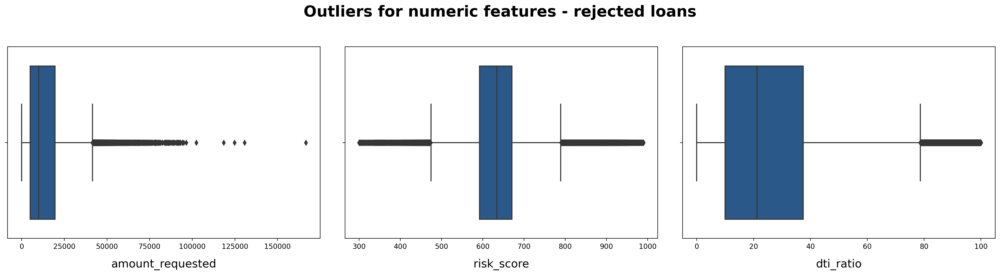

In [44]:
fig = plt.figure(figsize=(20, 24))

numeric_cols = rejected.select_dtypes("float64").columns

fig.suptitle(
    "Outliers for numeric features - rejected loans",
    fontsize=22,
    fontweight="semibold",
    y=1.01,
)

for i, column in enumerate(numeric_cols, 1):
    ax = plt.subplot(5, 3, i)
    sns.boxplot(x=rejected[column], color="#1a5899")
    ax.set_xlabel(column, labelpad=12, fontdict={"fontsize": 16})

plt.tight_layout(h_pad=3, w_pad=3)
plt.show()

**Insight**

Outliers are identified for all numeric columns in rejected loans dataset. However these extremes are important part of the analysis and are not removed or changed. 

### Concatenating accepted & rejected loan applications

In [45]:
accept_to_concat = accepted[
    [
        "loan_amnt",
        "issue_d",
        "title",
        "fico_score",
        "dti",
        "addr_state",
        "emp_length",
    ]
]

In [46]:
accept_to_concat = accept_to_concat.rename(
    columns={
        "loan_amnt": "amount_requested",
        "issue_d": "date",
        "title": "loan_purpose",
        "addr_state": "state",
        "dti": "dti_ratio",
    }
)
accept_to_concat["loan_status"] = "accepted"

In [47]:
reject_to_concat = rejected.rename(
    columns={
        "application_date": "date",
        "loan_title": "loan_purpose",
        "risk_score": "fico_score",
        "employment_length": "emp_length",
    }
)

reject_to_concat["loan_status"] = "rejected"
reject_to_concat = reject_to_concat.drop(columns="zip_code")

In [48]:
loans = pd.concat([accept_to_concat, reject_to_concat], ignore_index=True)

In [49]:
loans.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16509357 entries, 0 to 16509356
Data columns (total 8 columns):
 #   Column            Non-Null Count     Dtype         
---  ------            --------------     -----         
 0   amount_requested  16509357 non-null  float64       
 1   date              16509357 non-null  datetime64[ns]
 2   loan_purpose      16509357 non-null  object        
 3   fico_score        5163294 non-null   float64       
 4   dti_ratio         16509357 non-null  float64       
 5   state             16509357 non-null  object        
 6   emp_length        16509357 non-null  object        
 7   loan_status       16509357 non-null  object        
dtypes: datetime64[ns](1), float64(3), object(4)
memory usage: 1007.7+ MB


In [50]:
loans["state_long"] = loans["state"].map(states)

In [51]:
loans.head()

,amount_requested,date,loan_purpose,fico_score,dti_ratio,state,emp_length,loan_status,state_long
0,5000.0,2018-03-01,other,667.0,21.80,OK,8 years,accepted,Oklahoma
1,15000.0,2018-03-01,debt_consolidation,702.0,18.29,FL,2 years,accepted,Florida
2,25000.0,2018-03-01,debt_consolidation,667.0,12.89,AL,10+ years,accepted,Alabama
3,3000.0,2018-03-01,major_purchase,762.0,0.58,WA,9 years,accepted,Washington
4,17000.0,2018-03-01,debt_consolidation,672.0,15.65,FL,10+ years,accepted,Florida


## Accepted vs Rejected loans - EDA

### Loan status

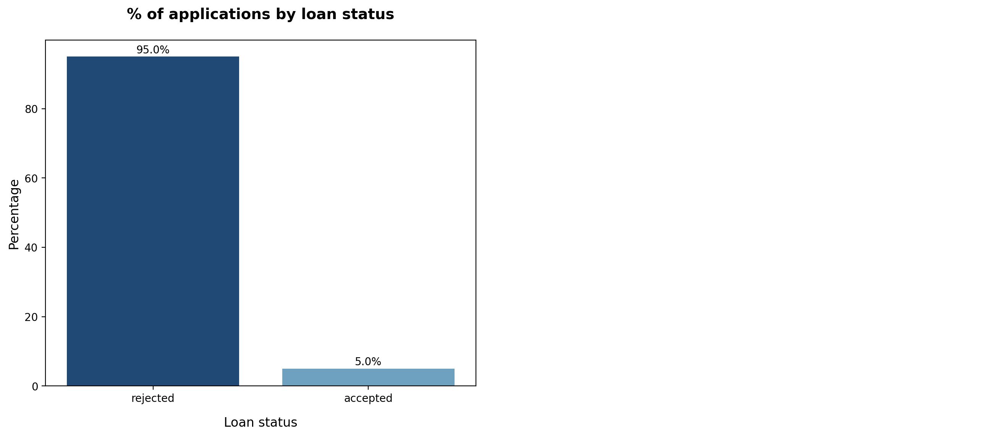

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

plot_norm_value_counts("loan_status", ax[0], loans, palette=custom_palette)

ax[1].axis("off")
plt.show()

In [53]:
loans["loan_status"].value_counts()

rejected    15681946
accepted      827411
Name: loan_status, dtype: int64

**Insights**

- Classifying loan applications into accepted and rejected is the first goal for ML part of this project. Accordingly the most detail analysis is made identifying and validating key factors for distinguising a loan application as accepted or rejected.
- Out of more than 16.5M loan applications only 5% are accepted - label distribution is imbalanced and additional steps need to be taken for ML part.

### Amount requested

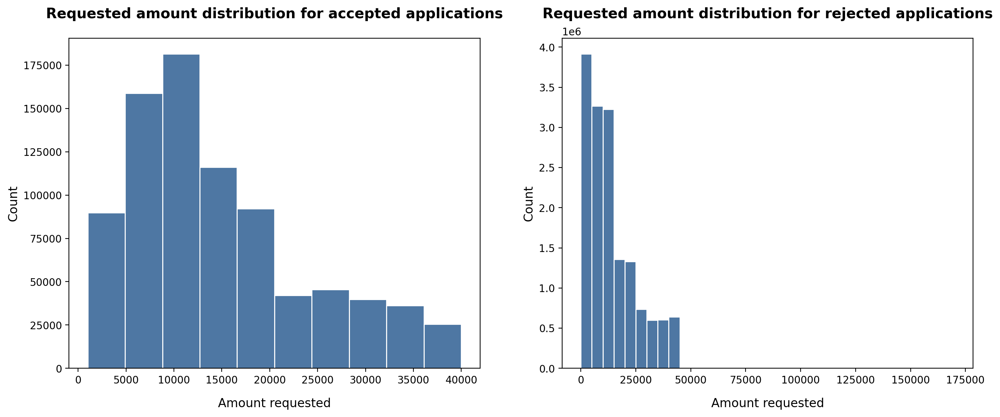

In [54]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(
    loans[loans["loan_status"] == "accepted"]["amount_requested"],
    bins=10,
    edgecolor="white",
    ax=ax[0],
)
set_labels(
    ax[0],
    "Requested amount distribution for accepted applications",
    "amount requested",
    "count",
)

sns.histplot(
    loans[loans["loan_status"] == "rejected"]["amount_requested"],
    bins=new_bins,
    edgecolor="white",
    ax=ax[1],
)
set_labels(
    ax[1],
    "Requested amount distribution for rejected applications",
    "amount requested",
    "count",
)

plt.show()

In [55]:
loans.groupby("loan_status").agg(
    mode =("amount_requested", pd.Series.mode),
    mean_amount=("amount_requested", "mean"),
    min_amount=("amount_requested", "min"),
    max_amount=("amount_requested", "max"),
).round(2)

,mode,mean_amount,min_amount,max_amount
loan_status,,,,
accepted,10000.0,14912.80,1000.0,40000.0
rejected,10000.0,12412.75,25.0,166650.0


**Insights**

- `Requested_amount` distribution for accepted loan applications is right skewed with the peak around 10000 and most of applications between 5000 and 15000.
- `Requested_amount` distribution for rejected loan applications is highly right skewed with the peak around 5000 and most data points between 1000 and 15000. Outliers are present at the higher end.
- The avg `requested_amount` is similar for both accepted and rejected loans. Hypothesis testing is performed to prove/ disprove the significance in difference of means.

#### Hypothesis testing & confidence intervals

**Research statistic - difference in two population means**

Considering rejected and accepted loans data for the period 2017-2018, do accepted loan applications have statistically significant difference in mean requested amount than rejected loan applications?

**Population**: accepted and rejected loan applications  
**Parameter of Interest**: difference in means ($\mu_1 - \mu_2$)  
**Null Hypothesis:** there is no statistically significant difference in mean requested amount between accepted and rejected loans ($\mu_1 = \mu_2$)  
**Alternative Hypthosis:** there is statistically significant difference in mean requested amount between accepted and rejected loans ($\mu_1 \neq \mu_2$)

**Significance level (alfa):** 0.05

In [56]:
loans.groupby("loan_status").agg(
    sample_size=("loan_status", "count"),
    avg_amount=("amount_requested", "mean"),
).round(2)

,sample_size,avg_amount
loan_status,,
accepted,827411,14912.80
rejected,15681946,12412.75


In [57]:
compare_means_ztest(
    loans[loans["loan_status"] == "accepted"]["amount_requested"],
    loans[loans["loan_status"] == "rejected"]["amount_requested"],
)

,p-value,z-statistic,CI lower,CI upper,significance
difference in means,0.0,227.73,2478.53,2521.56,Stat. significant difference


**Insights**

- Hypothesis testing proved that there is statistically significant difference in mean requested amount between accepted and rejected loans.
- However it is difficult to evaluate prediction power of `requested_amount` as a feature because the difference between accepted and rejected loans is rather small.

### Date

In [58]:
loans_by_year = loans.groupby([loans["date"].dt.year, "loan_status"]).agg(
    percentage=("date", "count")
)
percentage_by_year = (
    loans_by_year.groupby(level=0).apply(lambda x: 100 * x / float(x.sum())).round(2)
)
percentage_by_year

percentage
date loan_status            
2017 accepted           5.78
     rejected          94.22
2018 accepted           4.46
     rejected          95.54

In [59]:
loans_date = loans.set_index("date")

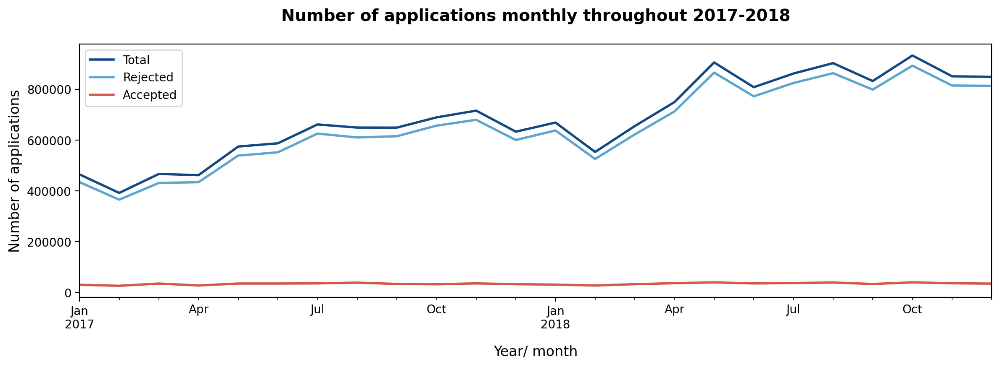

In [60]:
three_color_palette = ["#124984", "#5fa5cd", "#d25849"]
sns.set_palette(three_color_palette)

fig, ax = plt.subplots(figsize=(14, 4))

loans_date["loan_status"].resample("M").count().plot(ax=ax, legend=True, lw=2)
loans_date[loans_date["loan_status"] == "rejected"]["loan_status"].resample(
    "M"
).count().plot(ax=ax, legend=True, lw=2)
loans_date[loans_date["loan_status"] == "accepted"]["loan_status"].resample(
    "M"
).count().plot(ax=ax, legend=True, lw=2)

ax.legend(["Total", "Rejected", "Accepted"])
set_labels(
    ax,
    "Number of applications monthly throughout 2017-2018",
    "Year/ Month",
    "number of applications",
)

plt.show()

**Insights**

- In general, total number of applications has grown from ~400000 monthly to ~800000 throughout 2 years period (from the beggining of 2017 till the end of 2018) with couple downs along the line.
- Number of rejected loan applications per month closely follows the trend of total number of applications.
- The number of accepted loans per month seems keeping the same rate over the period from 2017 to 2018.
- However it is difficult to identify any seasonal patterns looking at the continuous progression during the two years period therefore further analysis is mostly focused on comparing the trends monthly between 2017 and 2018.

#### Accepted loan applications

In [61]:
loans_by_year_month = loans.groupby(
    [loans["date"].dt.year, loans["date"].dt.month, "loan_status"]
).agg(count=("date", "count"))
loans_by_year_month.index.names = ["year", "month", "loan_status"]

percent_by_year_month = (
    loans_by_year_month.groupby(level=[0, 1])
    .apply(lambda x: 100 * x / float(x.sum()))
    .round(2)
)
percent_by_year_month = percent_by_year_month.rename(columns={"count": "percentage"})
accepted_percent = percent_by_year_month.xs(
    "accepted", level=2, drop_level=False
).droplevel("loan_status")
rejected_percent = percent_by_year_month.xs(
    "rejected", level=2, drop_level=False
).droplevel("loan_status")

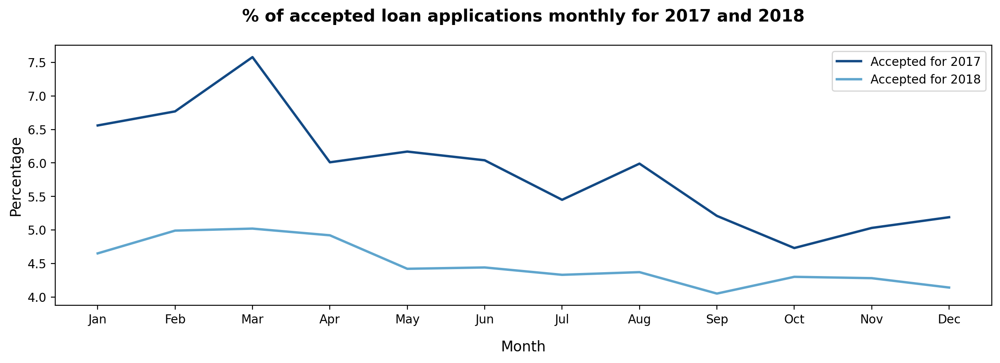

In [62]:
fig, ax = plt.subplots(figsize=(14, 4))

accepted_percent.xs(2017, level=0, drop_level=False).plot(ax=ax, lw=2)
accepted_percent.xs(2018, level=0, drop_level=False).plot(ax=ax, lw=2)
ax.set_xticks(range(0, 12))
ax.set_xticklabels([item for item in months])
ax.legend(["Accepted for 2017", "Accepted for 2018"])
set_labels(
    ax,
    "% of accepted loan applications monthly for 2017 and 2018",
    "Month",
    "Percentage",
)

plt.show()

**Insights**

- Comparing percentage of accepted loan applications monthly (out of total loan applications monthly) for 2017 and 2018, it is difficult to notice any seasonal (or periodical) patterns.
- Seems that overall trend is that the percentage of accepted loan applications slowly decreases from the begging of the year till the end however the progression (slope) of the line is different for 2017 and 2018.

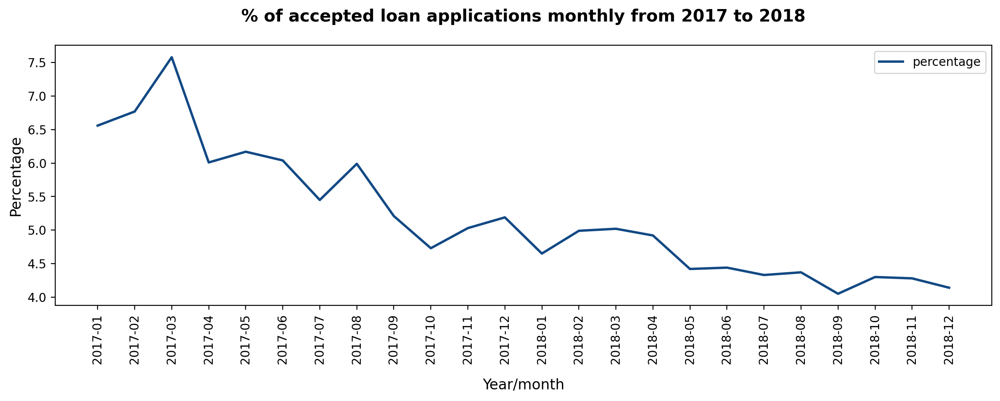

In [63]:
fig, ax = plt.subplots(figsize=(14, 4))

accepted_percent.plot(ax=ax, lw=2)

ax.set_xticks(range(len(accepted_percent)))
ax.set_xticklabels(
    ["%s-%02d" % item for item in accepted_percent.index.to_list()], rotation=90
)

set_labels(
    ax,
    "% of accepted loan applications monthly from 2017 to 2018",
    "year/Month",
    "Percentage",
)

plt.show()

**Insight**

- Plotting percentage of accepted loan applications monthly (out of total loan applications monthly) over two years period, it is obvious the trend has dropped from ~7% in the beggining of 2017 to ~4% at the end of 2018.
- However this finding will not probably contribute to classifying the loan applications into accpeted or rejected.

#### Rejected loan applications

In [64]:
rejected_monthly = loans_by_year_month.xs("rejected", level=2, drop_level=True)

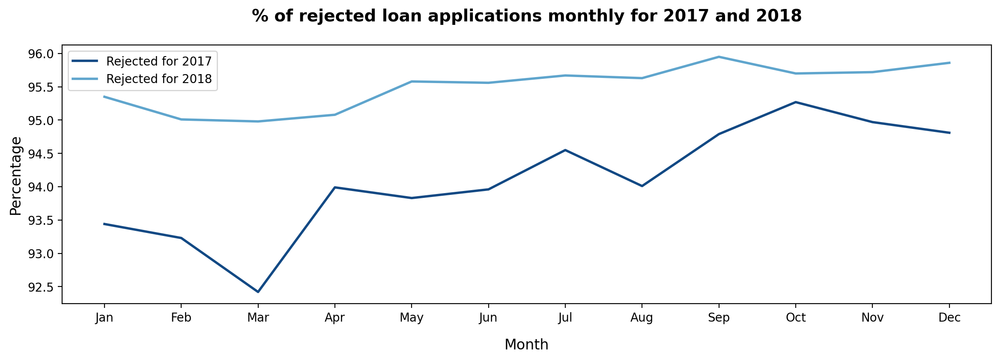

In [65]:
fig, ax = plt.subplots(figsize=(14, 4))

rejected_percent.xs(2017, level=0, drop_level=False).plot(ax=ax, lw=2)
rejected_percent.xs(2018, level=0, drop_level=False).plot(ax=ax, lw=2)

ax.set_xticks(range(0, 12))
ax.set_xticklabels([item for item in months])
ax.legend(["Rejected for 2017", "Rejected for 2018"])
set_labels(
    ax,
    "% of rejected loan applications monthly for 2017 and 2018",
    "Month",
    "Percentage",
)

plt.show()

**Insights**

- Comparing percentage of rejected loan applications monthly (out of total loan applications monthly) for 2017 and 2018, it is difficult to notice any seasonal (or periodical) patterns.
- Seems that overall trend is that the percentage of rejected loan applications slowly increases from the begging of the year till the end however the progression (slope) of the line is very different for 2017 and 2018.

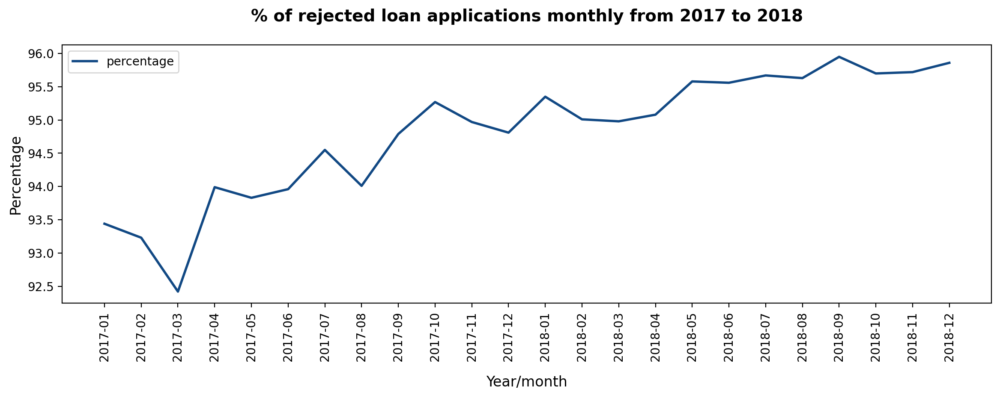

In [66]:
fig, ax = plt.subplots(figsize=(14, 4))

rejected_percent.plot(ax=ax, lw=2)

ax.set_xticks(range(len(rejected_percent)))
ax.set_xticklabels(
    ["%s-%02d" % item for item in rejected_percent.index.to_list()], rotation=90
)
set_labels(
    ax,
    "% of rejected loan applications monthly from 2017 to 2018",
    "year/Month",
    "Percentage",
)

plt.show()

**Insights**

- As expected, overall the percentage of rejected loan applications monthly has been growing from the beggining of 2017 till the end of 2018. However this finding does not really help in picking out the differences between accepted and rejected loan applications.
- `Date` as a feature seems to have a low predictive power for classifying applications into accepted and rejected.

### Loan purpose

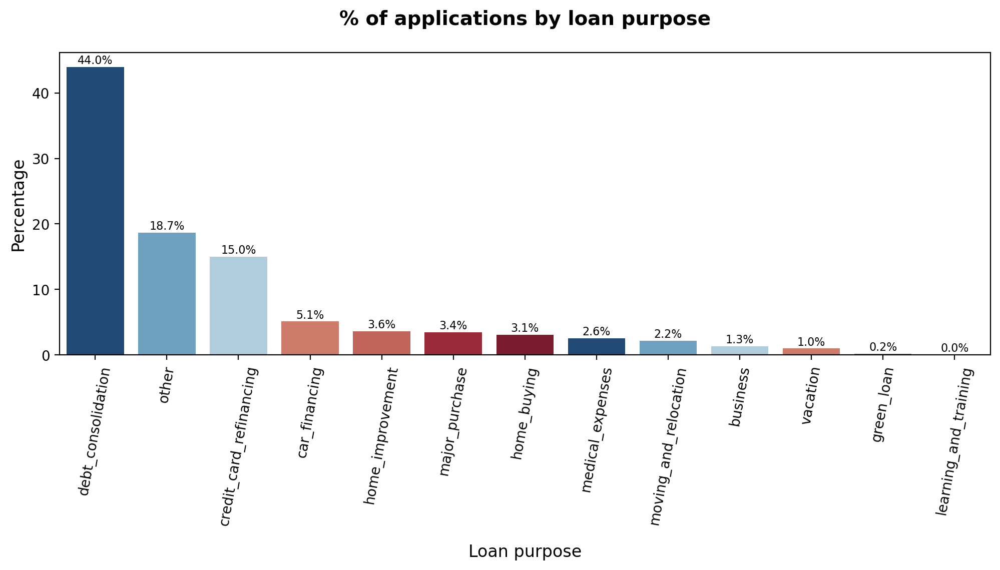

In [67]:
fig, ax = plt.subplots(figsize=(12, 4))

plot_norm_value_counts(
    "loan_purpose", ax, loans, y_location=0.1, font_size=8, palette=custom_palette
)

plt.xticks(rotation=80)
plt.show()

In [68]:
loans[loans["loan_purpose"] == "learning_and_training"]["loan_purpose"].count()

79

**Insights**

- Most of applicants (~44%) apply for the loan for `debt_consolidation` purpose.
- The second known loan purpose by percentage of applications is `credit_card_refinancing`. Debt consolidation and credit card refinancing refer to the process of taking out a personal loan to pay off credit card debt. However debt consolidation does not limit the borrower to to paying off only credit cards.
- Surprisingly, only 79 loan applications out of more than 17M is for `learning_and_training` purposes.

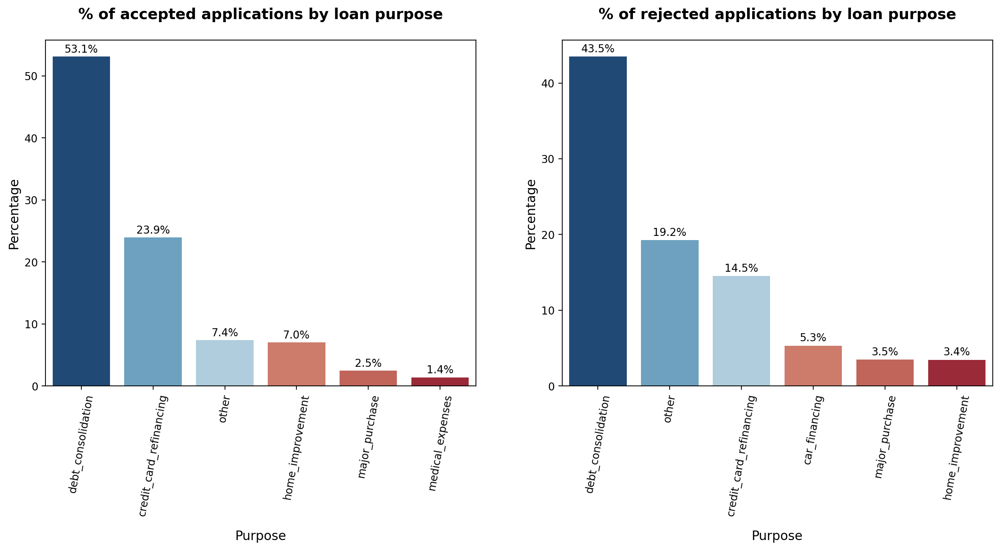

In [69]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

plot_top_percentage("loan_purpose", ax[0], loans[loans["loan_status"] == "accepted"], 6)
set_labels(
    ax[0],
    "% of accepted applications by loan purpose",
    "purpose",
    "percentage",
)
ax[0].tick_params(axis="x", labelrotation=80)

plot_top_percentage("loan_purpose", ax[1], loans[loans["loan_status"] == "rejected"], 6)
set_labels(
    ax[1],
    "% of rejected applications by loan purpose",
    "purpose",
    "percentage",
)
ax[1].tick_params(axis="x", labelrotation=80)

plt.show()

**Insights**

- The `debt_consolidation` is the main reason for both accepted and rejected loans.
- However the order of other loan purposes by the percentage of applicants is different for accepted ad rejected loan applications - this indicates that `loan_purpose` as a feature have modest or mild predicting power in distinguishing loans as accepted or rejected. 

#### Loan purpose for accepted loans by requested amount

In [70]:
loans[loans["loan_status"] == "accepted"].groupby("loan_purpose").agg(
    mean_amount=("amount_requested", "mean"),
).sort_values(by="mean_amount", ascending=False).round(2)

,mean_amount
loan_purpose,
business,17658.51
debt_consolidation,16031.00
home_buying,15956.84
credit_card_refinancing,14794.48
home_improvement,14712.89
major_purchase,13517.07
green_loan,11521.54
other,10766.65
car_financing,9756.64


#### Loan purpose for rejected loans by requested amount

In [71]:
loans[loans["loan_status"] == "rejected"].groupby("loan_purpose").agg(
    mean_amount=("amount_requested", "mean"),
).sort_values(by="mean_amount", ascending=False).round(2)

,mean_amount
loan_purpose,
business,15537.76
home_buying,15367.26
debt_consolidation,14283.24
credit_card_refinancing,13711.48
home_improvement,13657.56
major_purchase,13061.10
car_financing,12990.08
learning_and_training,11665.71
green_loan,8855.97


**Insights**

- `Business` is the dominant purpose based on requested loan amount for both, accepted and rejected applications.
- The order of other loan purposes by requested amount is slightly different for accepted ad rejected loan applications.

### Fico score

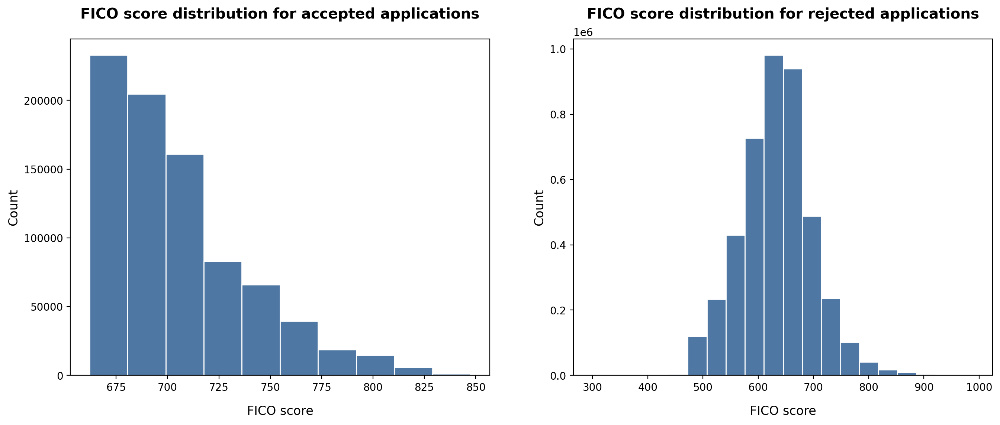

In [72]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(
    loans[loans["loan_status"] == "accepted"]["fico_score"],
    bins=10,
    edgecolor="white",
    ax=ax[0],
)
set_labels(
    ax[0],
    "Fico score distribution for accepted applications",
    "Fico score",
    "count",
)

sns.histplot(
    loans[loans["loan_status"] == "rejected"]["fico_score"],
    bins=20,
    edgecolor="white",
    ax=ax[1],
)
set_labels(
    ax[1],
    "Fico score distribution for rejected applications",
    "Fico score",
    "count",
)

plt.show()

In [73]:
loans.groupby("loan_status").agg(
    mean_fico=("fico_score", "mean"),
    min_fico=("fico_score", "min"),
    max_fico=("fico_score", "max"),
).round(2)

,mean_fico,min_fico,max_fico
loan_status,,,
accepted,704.17,662.0,847.5
rejected,633.02,300.0,990.0


**Insights**

- Based on LendingClub requirements fico (risk) score should be good (670–739) or excellent (800 and above). Some applications could be accepted with medium (fair) fico score but not lower than 600. Generally, lenders consider people with higher scores to be more desirable borrowers, as they’re typically at a lower risk of defaulting on their loans.
- Distribution of `fico_score` for accepted loans is right skewed with the peak around 670 and most of the data between 600 and 700 with some outliers at the higher end.
- `Fico_score` distribution for rejected loan applications is roughly bell-shaped with a center of ~650 and most of the data between 580 and 680.
- Interestingly enough, the mean `fico_score` for accepted loans is a little bit above 700 and for rejected loan applications is more than 600. The difference in mean fico between accepted and rejected loan applications is notable but to be sure, hypothesis testing is performed to prove/ disprove the significance in difference.

#### Hypothesis testing & confidence intervals

**Research statistic - difference in two population means**

Considering rejected and accepted loans data over the period from 2017 to 2018, do accepted loan applications have statistically significant difference in mean fico score than rejected loan applications?

**Population**: accepted and rejected loan applications  
**Parameter of Interest**: difference in means ($\mu_1 - \mu_2$)  
**Null Hypothesis:** there is no statistically significant difference in mean fico score between accepted and rejected loans ($\mu_1 = \mu_2$)  
**Alternative Hypthosis:** there is statistically significant difference in mean fico score between accepted and rejected loans ($\mu_1 \neq \mu_2$)

**Significance level (alfa):** 0.05

In [74]:
loans.dropna().groupby("loan_status").agg(
    sample_size=("loan_status", "count"),
    avg_fico=("fico_score", "mean"),
).round(2)

,sample_size,avg_fico
loan_status,,
accepted,827411,704.17
rejected,4335883,633.02


In [75]:
compare_means_ztest(
    loans[loans["loan_status"] == "accepted"]["fico_score"],
    loans[loans["loan_status"] == "rejected"].dropna()["fico_score"],
)

,p-value,z-statistic,CI lower,CI upper,significance
difference in means,0.0,1455.73,71.06,71.25,Stat. significant difference


**Insights**

- Hypothesis testing proved that there is statistically significant difference in mean fico score between accepted and rejected loans.
- `Fico_score` as a feature seems to have a strong predictive power for distinguishing loan applications into accepted and rejected.

### Debt-to-income ratio

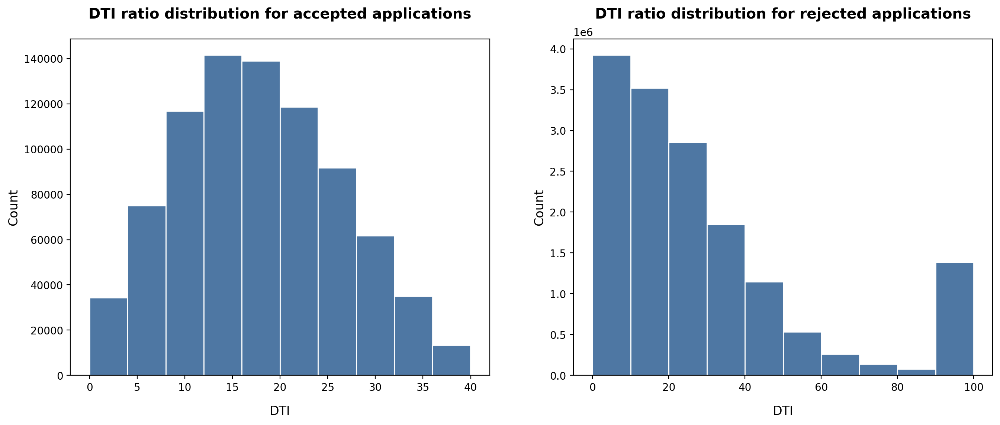

In [76]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(
    loans[loans["loan_status"] == "accepted"]["dti_ratio"],
    bins=10,
    edgecolor="white",
    ax=ax[0],
)
set_labels(
    ax[0],
    "Dti ratio distribution for accepted applications",
    "Dti",
    "count",
)

sns.histplot(
    loans[loans["loan_status"] == "rejected"]["dti_ratio"],
    bins=10,
    edgecolor="white",
    ax=ax[1],
)
set_labels(
    ax[1],
    "Dti ratio distribution for rejected applications",
    "Dti",
    "count",
)

plt.show()

the lower dti ratio the better 

In [77]:
loans.groupby("loan_status").agg(
    mean_dti=("dti_ratio", "mean"),
    min_dti=("dti_ratio", "min"),
    max_dti=("dti_ratio", "max"),
).round(2)

,mean_dti,min_dti,max_dti
loan_status,,,
accepted,17.78,0.0,39.99
rejected,28.96,0.0,100.00


**Insights**

- Distribution of `dti_ratio` for accepted loans is roughly bell-shaped with a center of 18 and most of the data between 10 and 25.
- `Dti_ratio` distribution for rejected loan applications is right skewed with most of the data between 0 and 20 and the highest peak around 10 and a second peak at the higher end around 100.
- The mean `dti_ratio` for accepted loans is close to 18 and for rejected loan applications is close to 29. The difference in mean `dti_ratio` between accepted and rejected loan applications is notable but to be sure, hypothesis testing is performed to prove/ disprove the significance in difference of means.

#### Hypothesis testing & confidence intervals

**Research statistic - difference in two population means**

Considering rejected and accepted loans data for the period 2017-2018, do accepted loan application have statistically significant difference in mean DTI ratio than rejected loan applications?

**Population**: accepted and rejected loan applications  
**Parameter of Interest**: difference in means ($\mu_1 - \mu_2$)  
**Null Hypothesis:** there is no statistically significant difference in mean DTI ratio between accepted and rejected loans ($\mu_1 = \mu_2$)  
**Alternative Hypthosis:** there is statistically significant difference in mean DTI ratio between accepted and rejected loans ($\mu_1 \neq \mu_2$)

**Significance level (alfa):** 0.05

In [78]:
loans.groupby("loan_status").agg(
    sample_size=("loan_status", "count"),
    avg_dti=("dti_ratio", "mean"),
).round(2)

,sample_size,avg_dti
loan_status,,
accepted,827411,17.78
rejected,15681946,28.96


In [79]:
compare_means_ztest(
    loans[loans["loan_status"] == "accepted"]["dti_ratio"],
    loans[loans["loan_status"] == "rejected"]["dti_ratio"],
)

,p-value,z-statistic,CI lower,CI upper,significance
difference in means,0.0,-963.75,-11.21,-11.16,Stat. significant difference


**Insights**

- Hypothesis testing proved that there is statistically significant difference in mean `dti_ratio` between accepted and rejected loan applications.
- `Dti_ratio` as a feature seems to have a strong predictive power for distinguishing loan applications into accepted and rejected.

#### Data relationship between FICO score and DTI ratio

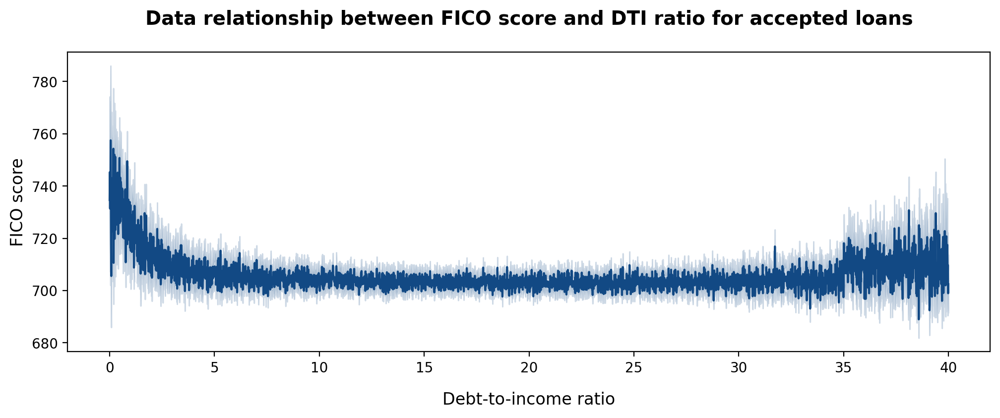

In [80]:
fig, ax = plt.subplots(figsize=(12, 4))

sns.lineplot(
    x="dti_ratio", y="fico_score", data=loans[loans["loan_status"] == "accepted"]
)
set_labels(
    ax,
    "Data relationship between fico score and dti ratio for accepted loans",
    "debt-to-income ratio",
    "fico score",
)

plt.show()

**Insights**

- Plotting `fico_score` against `dti_ratio` for accepted loans reveals three patterns:
    - while `dti_ratio` is low (until 5), the `fico_score` ranges roughly between 720 and 760;
    - while `dti_ratio` is in range from 5 to ~35, `fico_score` remains very consitent (a bit over 700);
    - once `dti_ratio` is over 35, `fico_score` fluctuates among 700 and 730.
- In general, very low and very high `dti_ratio` requires higher `fico_score` (for extra security) to pass through approval process.

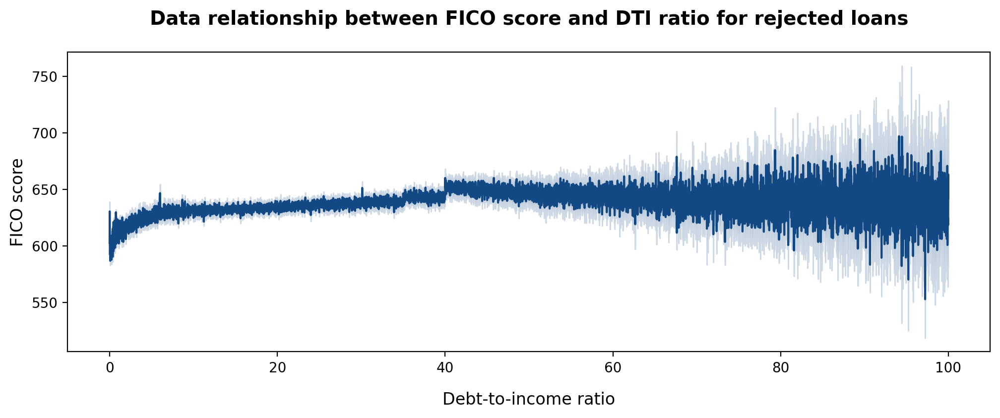

In [81]:
fig, ax = plt.subplots(figsize=(12, 4))

sns.lineplot(
    x="dti_ratio", y="fico_score", data=loans[loans["loan_status"] == "rejected"]
)
set_labels(
    ax,
    "Data relationship between fico score and dti ratio for rejected loans",
    "debt-to-income ratio",
    "fico score",
)
plt.show()

**Insights**

- Plotting `fico_score` against `dti_ratio` for rejected loans reveals very different pattern than for accepted loans:
    - while `dti_ratio` is very low (until 5), the `fico_score` ranges roughly between 600 and 630;
    - while `dti_ratio` is in range from 5 to 40, `fico_score` remains very consitent (~630);
    - once `dti_ratio` is over 40, the range for `fico_score` steadily expands with increasing `dti_ratio`.
- The difference in data relationships between `fico_score` and `dti_ratio` for accepted and rejected loans is a good indication that these two features play major role in accepting/rejecting loan application.

### State

In [82]:
state_pop_table = pd.read_html(
    "https://www.infoplease.com/us/states/state-population-by-rank?fbclid=IwAR0hvxB54a2ckZfxPJBsujtVYhVIx7OJU40zBrXgNRoI71snD228gUOm3Iw"
)
state_pop = (
    state_pop_table[0]
    .drop(columns=["Rank", "Percent of Total"])
    .rename(columns={"State": "state_long", "2020 Census": "population"})
)
state_pop = state_pop[:-1]

In [83]:
loans_by_state = (
    loans.groupby(["state_long", "state"])
    .agg(
        total_count=("loan_status", "count"),
        accepted=("loan_status", count_accepted),
        rejected=("loan_status", count_rejected),
    )
    .reset_index()
)

loans_by_state = loans_by_state.merge(state_pop, on="state_long")

In [84]:
loans_by_state["%_of_pop"] = (
    loans_by_state["total_count"] / loans_by_state["population"] * 100
).round(2)
loans_by_state["accepted_%_of_pop"] = (
    loans_by_state["accepted"] / loans_by_state["population"] * 100
).round(2)
loans_by_state["rejected_%_of_pop"] = (
    loans_by_state["rejected"] / loans_by_state["population"] * 100
).round(2)

In [85]:
fig = px.choropleth(
    loans_by_state,
    locations="state",
    locationmode="USA-states",
    scope="usa",
    color="total_count",
    color_continuous_scale="RdBu_r",
    hover_name="state_long",
    hover_data={"total_count": True, "state": False},
)

fig.update_layout(
    title_text="Number of loan applications by state (2017-2018)",
    title_font_size=22,
    title_font_color="black",
    title_x=0.45,
    dragmode=False,
)

fig.show()

In [86]:
fig = px.choropleth(
    loans_by_state,
    locations="state",
    locationmode="USA-states",
    scope="usa",
    color="%_of_pop",
    color_continuous_scale="RdBu_r",
    hover_name="state_long",
    hover_data={"state": False},
)

fig.update_layout(
    title_text="% of loan applications per capita by state (2017-2018)",
    title_font_size=22,
    title_font_color="black",
    title_x=0.45,
    dragmode=False,
)

fig.show()

**Insights**

- California is top state by total number of loan applications but at the same time it is the state with the highest population. Same applies for Texas, Florida, etc.
- To identify most-loan states, it is worth looking at the percentage of loan applications per capita in each state.
- Nevada excels at percentage of loan applications per capita, followed by Georgia, Mississipi, Florida.
- Note: LendingClub did/does not provide loans for residents of Iowa.

#### Accepted loan applications by state

In [87]:
fig = px.choropleth(
    loans_by_state,
    locations="state",
    locationmode="USA-states",
    scope="usa",
    color="accepted_%_of_pop",
    color_continuous_scale="RdBu_r",
    hover_name="state_long",
    hover_data={"state": False},
)

fig.update_layout(
    title_text="% of accepted loans per capita by state (2017-2018)",
    title_font_size=22,
    title_font_color="black",
    title_x=0.45,
    dragmode=False,
)

fig.show()

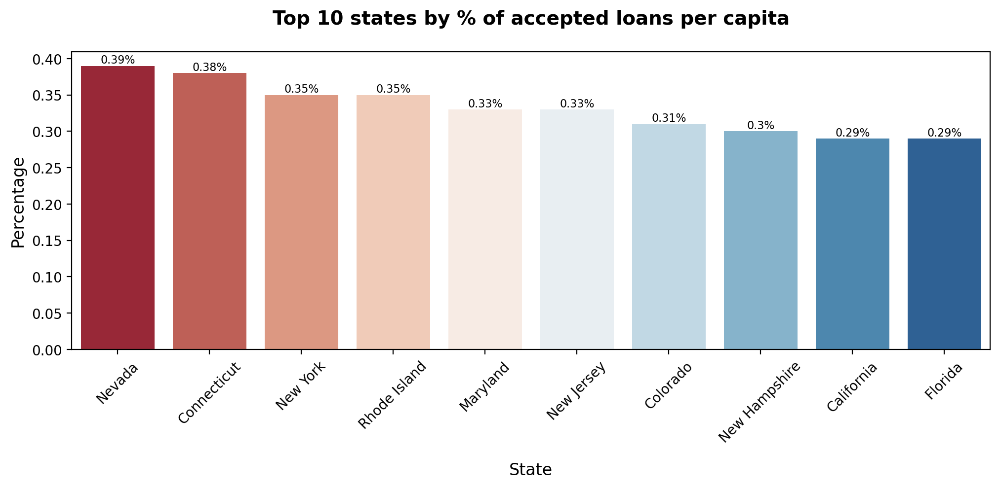

In [88]:
fig, ax = plt.subplots(figsize=(12, 4))

sns.barplot(
    x="state_long",
    y="accepted_%_of_pop",
    data=loans_by_state.nlargest(10, columns="accepted_%_of_pop"),
    palette="RdBu",
)
set_bar_values(ax, 8, sign="%", y_location=0, r=2)
set_labels(
    ax,
    "top 10 states by % of accepted loans per capita",
    "state",
    "percentage",
)

plt.xticks(rotation=45)
plt.show()

**Insights**

- Nevada is a top state based on percentage of accepted loans per capita, followed by Connecticut and New York.
- The expectation is that the higher the percentage of accepted loans per capita in a state, the better are the conditions for residents to be approved for the loan, for example the higher FICO score or lower DTI ratio.

In [89]:
fico_dti_by_state = loans.groupby(["state_long"]).agg(
    avg_fico=("fico_score", "mean"), avg_dti=("dti_ratio", "mean")
)

fico_dti_by_state = fico_dti_by_state.drop("Iowa")

In [90]:
top_states = loans_by_state.nlargest(10, columns="accepted_%_of_pop")[
    "state_long"
].to_list()

In [91]:
norm_fico_dti_by_state = (
    fico_dti_by_state - fico_dti_by_state.mean()
) / fico_dti_by_state.std()

sorted_fico_by_state = norm_fico_dti_by_state.sort_values(
    by="avg_fico", ascending=False
).reset_index()
sorted_dti_by_state = norm_fico_dti_by_state.sort_values(by="avg_dti").reset_index()

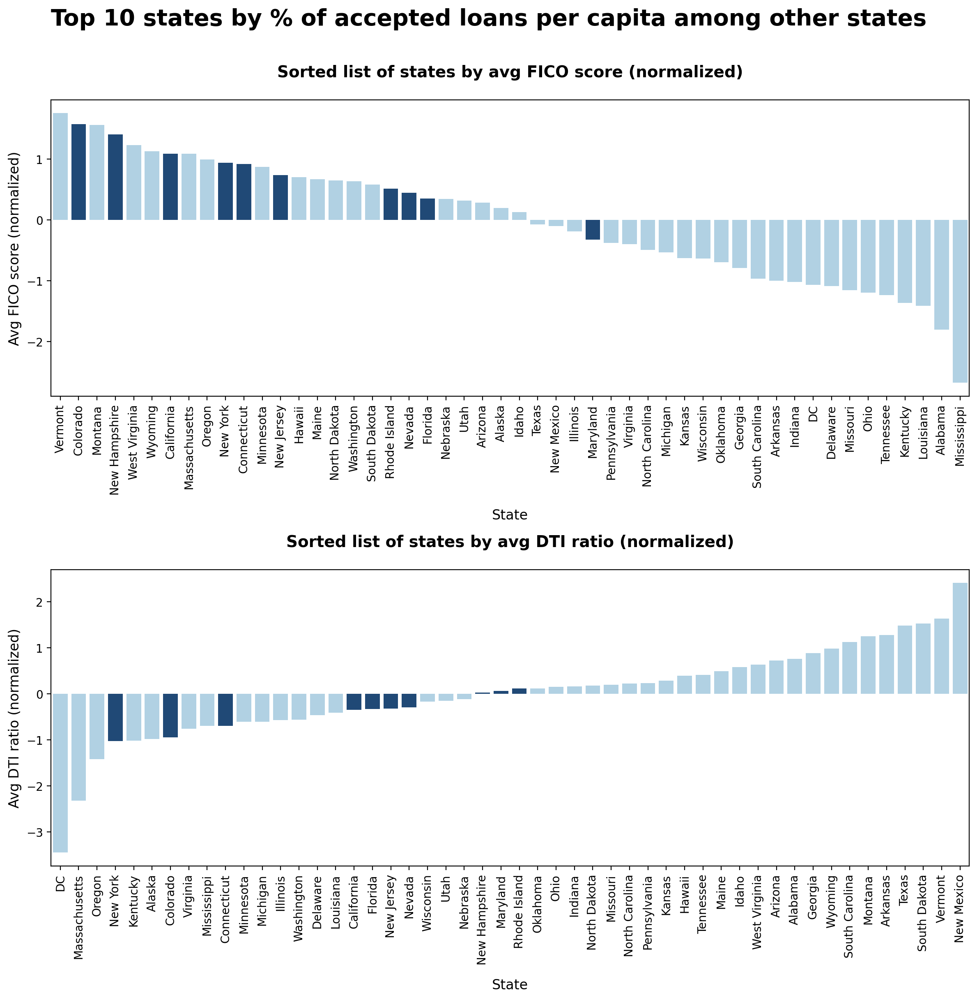

In [92]:
fig, ax = plt.subplots(2, 1, figsize=(12, 12))
fig.suptitle(
    "Top 10 states by % of accepted loans per capita among other states",
    fontsize=20,
    fontweight="semibold",
    y=1.01,
)

plot_avg_by_state(ax[0], "avg_fico", sorted_fico_by_state, top_states)
plot_avg_by_state(ax[1], "avg_dti", sorted_dti_by_state, top_states)

plt.tight_layout()
plt.show()

**Insights**

- Listing states by the mean `fico_score` and mean `dti_ratio`, it is notable that top states by percentage of accepted loans per capita have higher `mean_fico` score and lower `dti_ratio` among all the other states. 
- However it is not necessary straight forward data relationship, therefore it is diffcult to evaluate how much state-relation information would improve classification of accepted and rejected loans.
- Same type of analysis by state for rejected loan applications could be found in Annex.

### Employment length

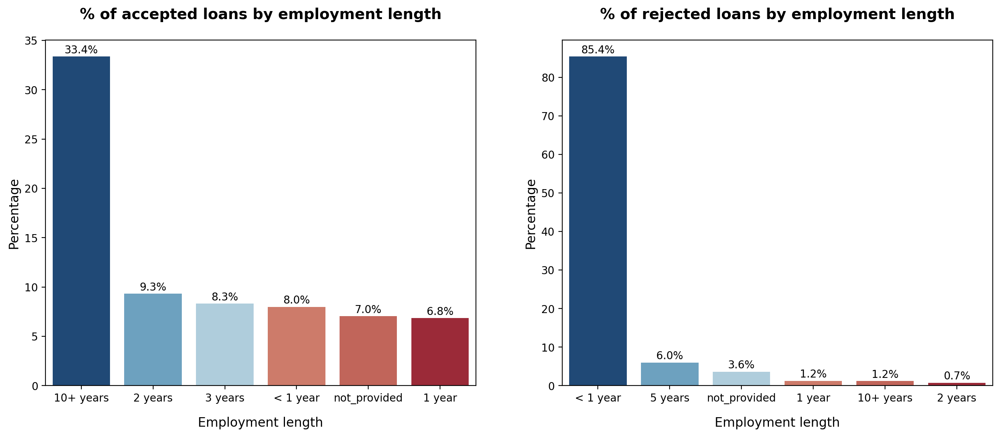

In [93]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

plot_top_percentage(
    "emp_length", ax[0], loans[loans["loan_status"] == "accepted"], 6, y_location=0.1
)
set_labels(
    ax[0],
    "% of accepted loans by employment length",
    "employment length",
    "percentage",
)

plot_top_percentage(
    "emp_length",
    ax[1],
    loans[loans["loan_status"] == "rejected"],
    6,
)
set_labels(
    ax[1],
    "% of rejected loans by employment length",
    "employment length",
    "percentage",
)

plt.show()

**Insights**

- The largest proportion, more than 33% of applicants for accepted loans, have more than 10 years of working experience.
- Majority (more than 85%) of applicants for rejected loans have less than 1 year of working experience.
- The difference in `employment_length` is really obvious between accepted and rejected loan applications and likely to have a prediction power for classification of accepted and rejected loans.

### Correlation

In [94]:
loans["loan_status"] = loans["loan_status"].map({"accepted": 1, "rejected": 0})

In [95]:
loans["month"] = loans["date"].dt.month
loans["mean_dti_by_state"] = loans.groupby("state_long")["dti_ratio"].transform("mean")
loans["mean_fico_by_state"] = loans.groupby("state_long")["fico_score"].transform(
    "mean"
)

In [96]:
loans_num = factorize_df(loans)

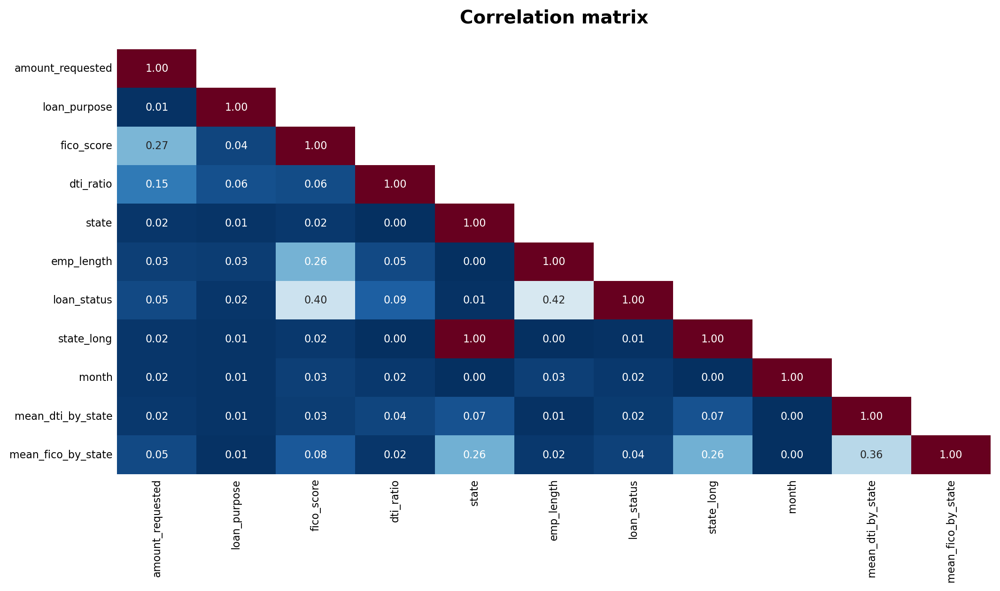

In [97]:
plt.figure(figsize=(12, 6))
correlations = loans_num.corr().abs()
mask = np.triu(correlations, 1)
ax = sns.heatmap(
    correlations,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    annot_kws={"fontsize": 8},
    cbar=False,
)
set_labels(ax, "Correlation matrix", "", "")

ax.tick_params(axis="both", which="both", length=0)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.show()

In [98]:
loans_num.corr()["loan_status"].abs().sort_values(ascending=False)[1:]

emp_length            0.418532
fico_score            0.395013
dti_ratio             0.090754
amount_requested      0.051137
mean_fico_by_state    0.035067
mean_dti_by_state     0.022154
month                 0.018291
loan_purpose          0.016200
state                 0.006199
state_long            0.006199
Name: loan_status, dtype: float64

**Insights**

- Correlation matrix proved data associations for loan application status (rejected vs accepted) that were discovered during individual feature analysis.
- `Loan_status` has a modest correlation with:
    - `emp_length`
    - `fico_score`
    - and mild correlation with `dti_ratio`

### Accepted vs Rejected loans - EDA findings

- EDA and statistical inference allows to idenfity key features and their impact for determining whether the loan is going to be accepted or rejected:
    - Requested loan amount, FICO score, DTI ratio and years of working experience have siginificant differences between accepted and rejected loan applications
    - Date of application, loan purpose and borrower's state as features have some indirect leads in identifying loan application status (accepted vs rejected) but they are not consistent and might be difficult for prediction algorithm to catch.
- The most evident differences between rejected and accepted loan applications are values outside predefined LendingClub norms, such as FICO score lower than 600. However I have too little experience to make decision if those cases should be handled outside ML scope or provided for the prediction algorithm to classify.

***

## Grade, subgrade & interest rate - EDA

Loan grading is a classification system that involves assigning a quality score to a loan based on a borrower's credit history, quality of the collateral, and the likelihood of repayment of the principal and interest. **'A' grade loans represent the lowest risk while 'G' grade loans are the riskiest.**

Loan (credit) grade determines the interest rate and fees. LendingClub’s interest rates take into account credit risk and market conditions. 
The final interest rate for each loan grade is the result of the following equation: *LendingClub Base Rate + Adjustment for Risk & Volatility*. The Adjustment for Risk & Volatility is designed to cover expected losses and provide higher risk-adjusted returns for each loan grade increment from A1 to G5. 
**LendingClub loans are fixed-rate loans, meaning that interest rate won't change over time.**

Based on LendingClub information laon grading depends on:
- Requested loan amount,
- Loan term: 36 or 60 months,
- Applicant’s FICO score,
- Certain other credit attributes.

**Reference**
https://www.lendingclub.com/foliofn/rateDetail.action (table provides interest rates by sub-grade for current market conditions)

**Approach**
- Feature analysis for grade, sub-grade and interest rate analysis is not as extensive as feature analysis for loan application status (accepted vs rejected).
- Only dataframe of accepted loan applicatios is used for further analysis as dataframe of rejected loan applications does not contain information about grade, sub-grade or interest rate.
- Grade, sub-grade and interest analysis is interconnected as these features (targets) correlate to each other. 

In [99]:
accepted.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 827411 entries, 421097 to 2157150
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   loan_amnt             827411 non-null  float64       
 1   funded_amnt           827411 non-null  float64       
 2   term                  827411 non-null  object        
 3   int_rate              827411 non-null  float64       
 4   grade                 827411 non-null  object        
 5   sub_grade             827411 non-null  object        
 6   emp_title             827411 non-null  object        
 7   emp_length            827411 non-null  object        
 8   home_ownership        827411 non-null  object        
 9   annual_inc            827411 non-null  float64       
 10  issue_d               827411 non-null  datetime64[ns]
 11  title                 827411 non-null  object        
 12  addr_state            827411 non-null  object       

In [100]:
accepted["term_int"] = accepted["term"].apply(convert_term)

In [101]:
accepted["loan_amnt"].equals(accepted["funded_amnt"])

True

In [102]:
accepted = accepted.drop(columns=["funded_amnt"])

### Grade

In [103]:
loans_by_grade_term = (
    accepted.groupby(["grade"])["term"]
    .value_counts(normalize=True)
    .to_frame()
    .round(2)
    .rename(columns={"term": "ratio"})
    .reset_index()
)

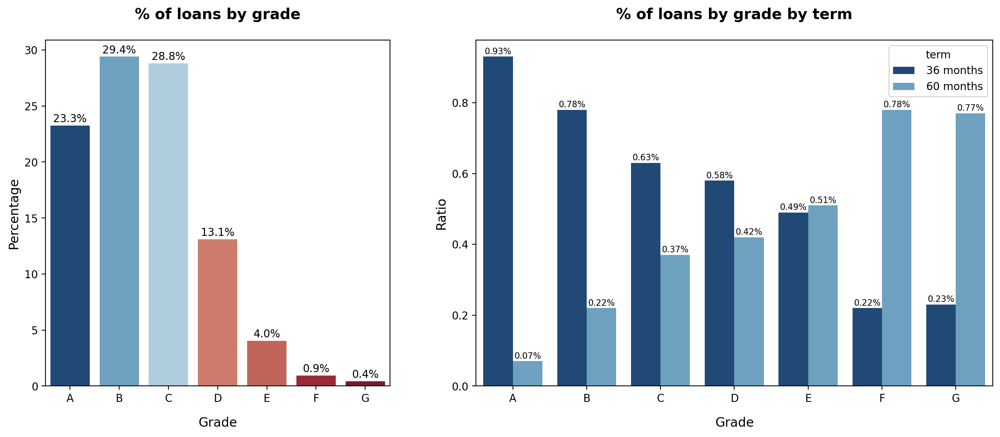

In [104]:
fig, ax = plt.subplots(1, 2, gridspec_kw={"width_ratios": [2, 3]}, figsize=(16, 6))

sns.barplot(
    x=(accepted["grade"].value_counts(normalize=True) * 100).index,
    y=(accepted["grade"].value_counts(normalize=True) * 100),
    ax=ax[0],
    order=["A", "B", "C", "D", "E", "F", "G"],
    palette=custom_palette,
)
set_bar_values(ax[0], 10, sign="%", y_location=0.1)
set_labels(
    ax[0],
    "% of loans by grade",
    "grade",
    "percentage",
)

sns.barplot(x="grade", y="ratio", data=loans_by_grade_term, hue="term", ax=ax[1])
set_bar_values(ax[1], 8, sign="%", y_location=0.002, r=2)
set_labels(ax[1], "% of loans by grade by term", "grade", "ratio")

plt.show()

In [105]:
accepted.groupby([accepted["issue_d"].dt.year])["term"].value_counts(
    normalize=True
).round(2)

issue_d  term      
2017      36 months    0.74
          60 months    0.26
2018      36 months    0.71
          60 months    0.29
Name: term, dtype: float64

**Insights**

- Majority of approved loans are assigned to grade B (more than 29%) and grade C (almost 29%). The lowest percentage of loans are assigned to grade G that are considered as high-risk loans.
- Plotting percentage of loans for each grade by `term`, it becomes clear that the 60-month term loan is more likely to be assigned to grade F or G while 36-month term loan is more likely to be allocated to grade A, B, C or even D. The proportions of 36-month term loan and 60-month term loan are very similar for grade E.
- `Term` as a feature seems to have a high prediction power for loan grade.


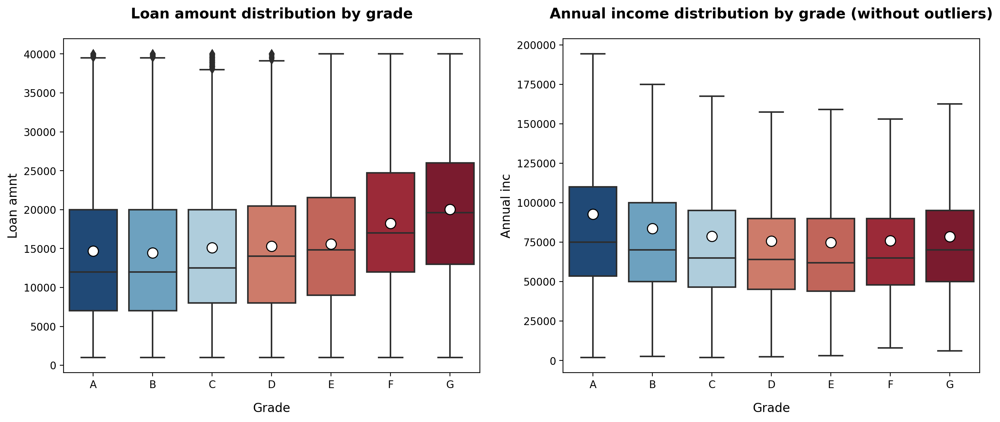

In [106]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

plot_grade_boxplot_means(
    ax[0], "loan_amnt", "loan amount distribution by grade", accepted
)
plot_grade_boxplot_means(
    ax[1],
    "annual_inc",
    "annual income distribution by grade (without outliers)",
    accepted,
    showfliers=False,
)

plt.show()

**Insights**

- `Loan_amnt` distribution by `grade` shows that the higher the amount the lower is the loan grade. However from grade A to E, the diffrence in mean loan amount is very delicate. The difference in loan amount becomes more obvious for lower grades. 
- `Annual_inc` distribution by `grade` shows two trends:
    - from A to E: the lower the income the lower the grade
    - for grades F and G the trend is opposite: seems that higher annual income may not always lead to higher grade (indicates that other factors have an impact on grading). 

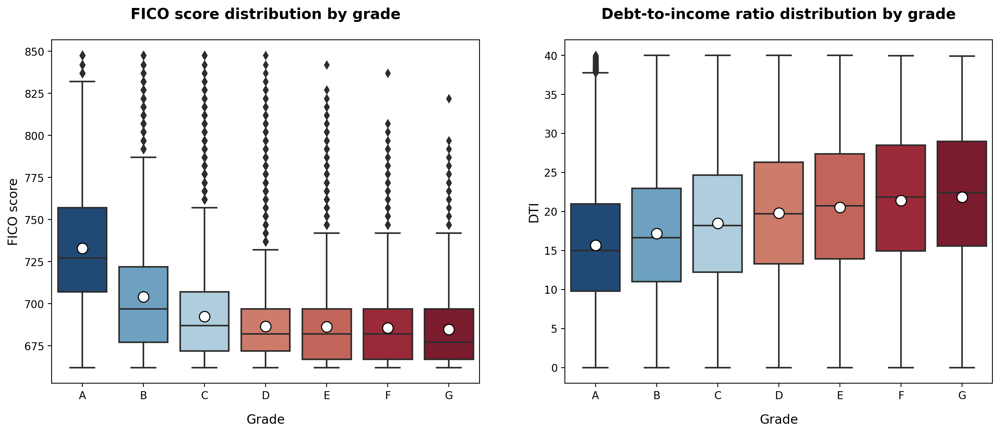

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

plot_grade_boxplot_means(
    ax[0], "fico_score", "fico score distribution by grade", accepted
)

plot_grade_boxplot_means(
    ax[1], "dti", "Debt-to-income ratio distribution by grade", accepted
)

plt.show()

**Insights**

- `Fico_score` distribution by `grade` indicates two trends:
    - from grade A to D - the lower the score the lower the grade
    - from grade D to G the mean fico score seems to be very similar
- DTI ratio distribution by `grade` shows that the higher the DTI ratio the lower the score - the increase among grades is very slight but constant.
- In general, `loan_amnt`, `annual_inc`, `fico_score` and `dti` features have certain associations and relationships with `grade` but not necessarily constant and linear which might be tricky for prediction algorithm to catch.

#### Grade correlation

In [108]:
accepted_num = factorize_df(accepted)

In [109]:
accepted_num.corr()["grade"].abs().sort_values(ascending=False)[1:].nlargest(10).round(
    3
)

sub_grade         0.408
int_rate          0.195
term              0.089
term_int          0.089
inq_last_6mths    0.030
loan_amnt         0.029
fico_score        0.027
dti               0.024
title             0.014
open_acc          0.008
Name: grade, dtype: float64

**Insights**

- `Grade` feature has the strongest correlation with `sub-grade` and `int_rate`.
- Surprisingly, `grade` has a very low (less than 0.1) correlation with all the other features. It proves that association with other features, such as `term`, `loan_amnt`, etc. is not linear.
- Going further into analysis, I would explore data relationship between grade and inq_last_6mths as well as grade and loan title (purpose).

### Sub-grade

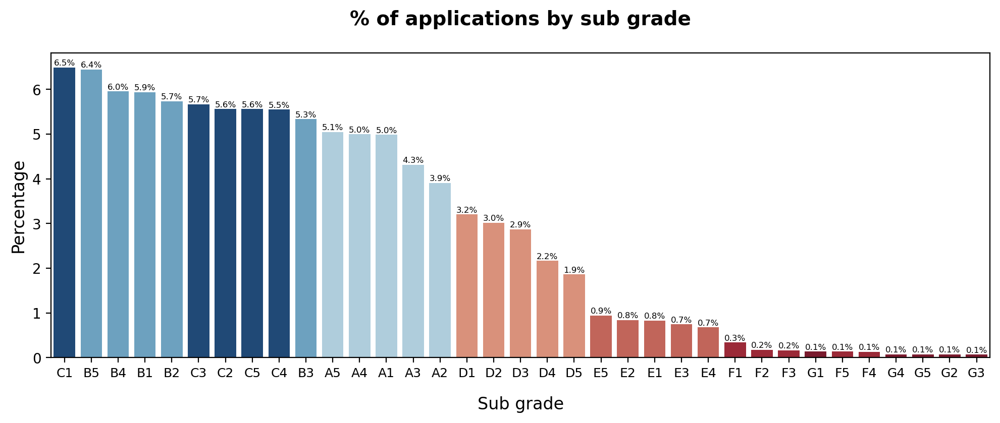

In [110]:
fig, ax = plt.subplots(figsize=(12, 4))

colors = []
for subgrade in accepted["sub_grade"].value_counts().index:
    if "C" in subgrade:
        colors.append("#124984")
    elif "B" in subgrade:
        colors.append("#5fa5cd")
    elif "A" in subgrade:
        colors.append("#a7d0e4")
    elif "D" in subgrade:
        colors.append("#e8896c")
    elif "E" in subgrade:
        colors.append("#d25849")
    elif "F" in subgrade:
        colors.append("#ae172a")
    else:
        colors.append("#8a0b25")

plot_norm_value_counts(
    "sub_grade", ax, accepted, y_location=0.01, font_size=6, palette=colors
)
plt.xticks(
    fontsize=9,
)

plt.show()

**Insights**

- The highest percentage of loans are assigned to subgrade C and D. The percentage of loans decrease slowly as the sub-grade gets lower. The lowest percentage of loans are assigned to grade G that are considered as high-risk loans - the difference in percentage between for subgrades of grade G is very mild.
- In general, the distribution of sub-grades by the percentage of loans is quite similar to the distribution of grades by percentage of loans (supported by modest correlation between `grade` and `sub_grade`). Therefore I would expect the same or similar data relationships with other features, such as, `term`, `loan_amnt`, `annual_inc`, `fico_score` and `dti`.

#### Data associations for sub-grade

In [111]:
accepted["sub_grade_enc"] = pd.factorize(accepted["sub_grade"], sort=True)[0] + 1
accepted["emp_length_int"] = pd.factorize(accepted["emp_length"], sort=True)[0] + 1

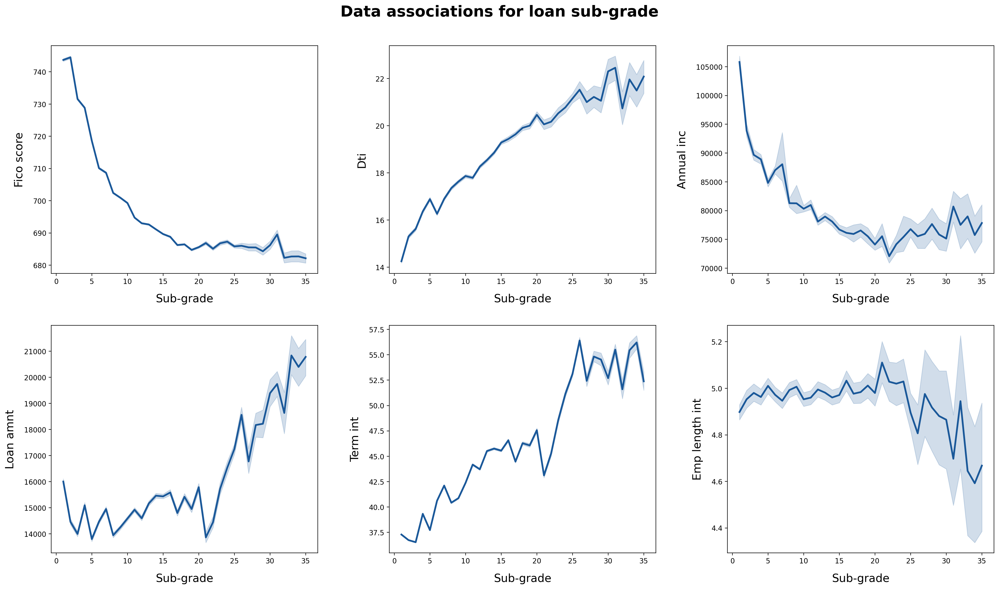

In [112]:
fig = plt.figure(figsize=(20, 22))

cols_to_plot = [
    "fico_score",
    "dti",
    "annual_inc",
    "loan_amnt",
    "term_int",
    "emp_length_int",
]

fig.suptitle(
    "Data associations for loan sub-grade",
    fontsize=22,
    fontweight="semibold",
    y=1.01,
)

for i, column in enumerate(cols_to_plot, 1):
    ax = plt.subplot(4, 3, i)
    sns.lineplot(
        x="sub_grade_enc", y=column, data=accepted, color="#1a5899", linewidth=2.5
    )
    ax.set_xlabel(
        "Sub-grade",
        fontdict={"fontsize": 16},
        labelpad=12,
    )
    ax.set_ylabel(
        str(column).replace("_", " ").capitalize(),
        fontdict={"fontsize": 16},
        labelpad=12,
    )

plt.tight_layout(h_pad=3, w_pad=3)
plt.show()

**Insights**

- Line plots indicate that `term`, `loan_amnt`, `annual_inc`, `fico_score` and `dti` features have certain associations and relationships with `sub-grade` but not necessarily constant which could be difficult for prediction algorithm to catch. 
- As `fico_score` decreases, `sub-grade` increases - the lower the FICO score, the higher the loan risk.
- As `dti` increases so do the `sub-grade` - the higher the DTI ratio, the higher the loan risk.
- As `annual_inc` decreases, the `sub-grade` increases reapidly until it reaches the point where `annual_inc` starts to grow again. 
- The `loan_amnt` till ~16000 have no consistent effect to `sub_grade`, however when `loan_amnt` goes over 16000, `sub_grade` increases reapidly (this affects only sub-grades for grades F and G)
- The line plot between `sub_grade` and `term_int` fluctuates quite a bit but general trend is that as term increase (goes from 36 months to 60 months) so do the `sub_grade`.

#### Sub-grade correlation

In [113]:
accepted_num.corr()["sub_grade"].abs().sort_values(ascending=False)[1:].nlargest(10)

int_rate          0.433634
grade             0.407534
fico_score        0.146222
term              0.131278
term_int          0.131278
dti               0.073618
inq_last_6mths    0.065733
title             0.033463
loan_amnt         0.031674
home_ownership    0.027072
Name: sub_grade, dtype: float64

**Insights**

- `Sub_grade` has the modest correlation with `int_rate` and `grade`. Surprisingly, `int_rate` is the most correlated feature with `sub_grade`.
- `Sub_grade` correlation with other features, such as `fico_score`, `term`, etc is very small (correlation coef. ~ 0.1).
- Going further into analysis, I would explore data relationship between sub-grade and inq_last_6mths as well as sub-grade and loan title (purpose).

### Interest rate

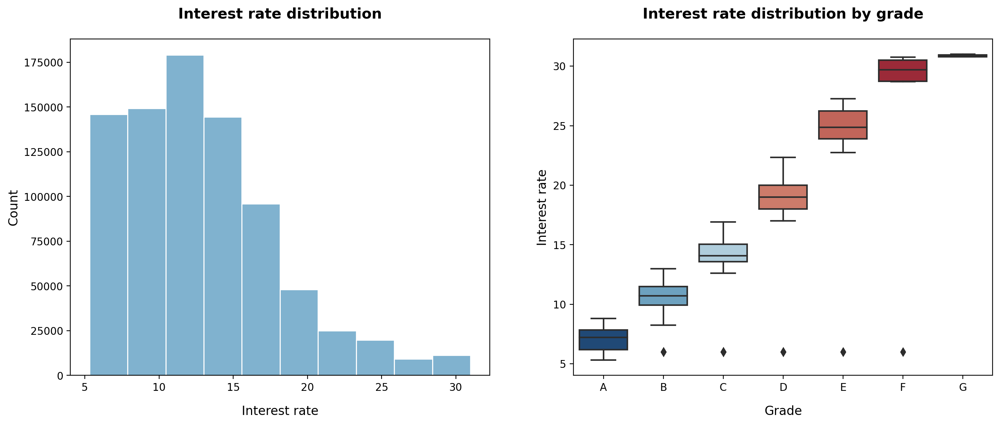

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

sns.histplot(
    accepted["int_rate"], bins=10, edgecolor="white", ax=ax[0], color="#5699bf"
)
set_labels(
    ax[0],
    "Interest rate distribution",
    "Interest rate",
    "count",
)

sns.boxplot(
    x="grade",
    y="int_rate",
    data=accepted,
    order=["A", "B", "C", "D", "E", "F", "G"],
    palette=custom_palette,
)
set_labels(
    ax[1],
    "Interest rate distribution by grade",
    "grade",
    "interest rate",
)

plt.show()

**Insights**

- `Int_rate` distribution is right skewed with the peak around 12 and most of data point between 5 and 15.
- `Int_rate` distribution by grade shows an evident relationship between `grade` and `int_rate`: as the interest rate grows, the grade decreases. In other words, low-risk loans gets low interest rate while high-risk loans are assigned high interest rate.

#### Interest rate by subgrade

In [115]:
int_rate_by_subgrade = (
    accepted.groupby(["grade", "sub_grade"])
    .agg(mean_int_rate=("int_rate", "mean"))
    .round(2)
)
int_rate_by_subgrade.style.format("{0:,.2f}").background_gradient(cmap="RdBu_r")

**Insights**

- As expected, `int_rate` and `sub-grade` has an evident negative linear relationship: as the interest rate grows, the sub-grade decreases.
- However the difference in mean interest rate among sub-grades are very subtle which could be tricky for model to catch.

#### Data associations for interest rate

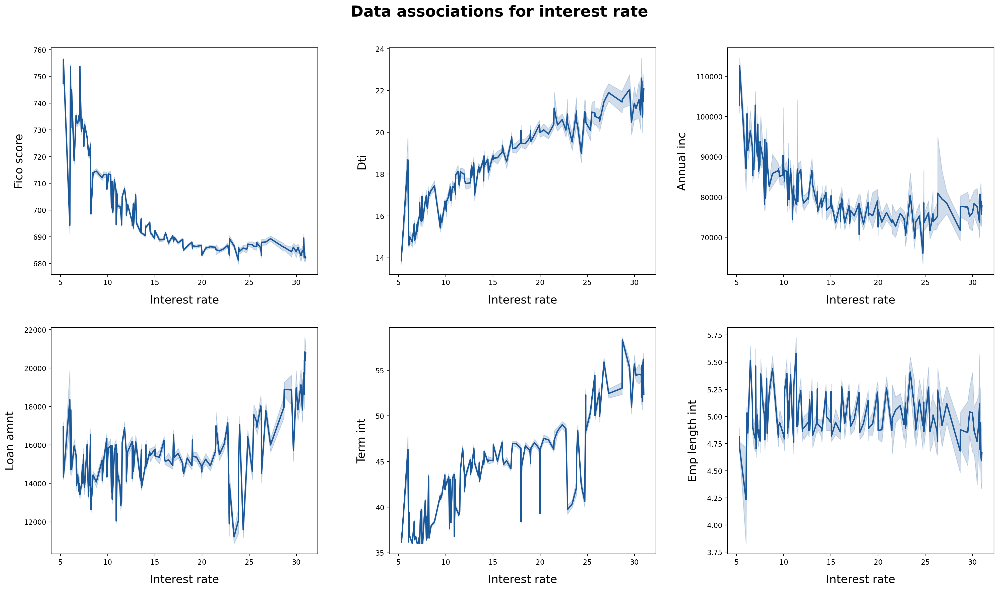

In [116]:
fig = plt.figure(figsize=(20, 22))

cols_to_plot = [
    "fico_score",
    "dti",
    "annual_inc",
    "loan_amnt",
    "term_int",
    "emp_length_int",
]

fig.suptitle(
    "Data associations for interest rate",
    fontsize=22,
    fontweight="semibold",
    y=1.01,
)

for i, column in enumerate(cols_to_plot, 1):
    ax = plt.subplot(4, 3, i)
    sns.lineplot(x="int_rate", y=column, data=accepted, color="#1a5899", linewidth=2)
    ax.set_xlabel(
        "Interest rate",
        fontdict={"fontsize": 16},
        labelpad=12,
    )
    ax.set_ylabel(
        str(column).replace("_", " ").capitalize(),
        fontdict={"fontsize": 16},
        labelpad=12,
    )

plt.tight_layout(h_pad=3, w_pad=3)
plt.show()

**Insights**

Interest rate data relationships:
- As `fico_score` decreases, `int_rate` increases. Low FICO score raises the loan risk and at the same time the interest rate.
- As `dti` increases so do the interest rate - the higher the DTI ratio, the higher the loan risk.
- As `annual_inc` decreases, the `int_rate` increases. Lower borrower's annual income raises the loan risk and at the same time the interest rate.
- There is no observable pattern between `loan_amnt` and `int_rate`.
- The line plot between `int_rate` and `term_int` is quite fluctuates but general trend is that as term increase (goes from 36 months to 60 months) so do the interest rate.
- Line plots indicate that `term`, `annual_inc`, `fico_score` and `dti` features have certain associations and relationships with `int_rate` but not necessarily constant and linear which could be difficult for prediction algorithm to catch.

#### Correlations

In [117]:
accepted_num.corr()["int_rate"].abs().sort_values(ascending=False)[1:].nlargest(10)

sub_grade         0.433634
fico_score        0.429925
term              0.326988
term_int          0.326988
grade             0.195005
dti               0.185717
inq_last_6mths    0.151679
title             0.087569
home_ownership    0.081205
delinq_2yrs       0.075776
Name: int_rate, dtype: float64

**Insights**
- As expected, `sub_grade` is the most correlated feature with `int_rate`. 
- Other features, such as `fico_score`, `term`, `dti` correlate very similarly with `int_rate` as with `sub_grade`. This may indicate the same data associations that could be visually observed. 
- Going further into analysis, I would investigate data relationship between interest rate and inq_last_6mths as well as interest rate and loan title (purpose).

### Grade, sub-grade, interest rate - EDA findings

During initial resource analysis it was discovered that grade, sub-grade and interest rate are interconnected and this was proved by EDA:
- Grade, sub-grade and interest rate quite highly correlate to each other. 
- Accordingly, other features, such as FICO score, DTI ratio, etc. have very similar impact on all three targets.
- EDA indicates that besides sub-grade and interest rate, loan term, requested loan amount, annual income, FICO score and DTI ratio have certain associations with loan grade but not necessarily constant and linear which might be tricky for prediction algorithm to catch.
- Loan sub-grade follows very similar data relationships as loan grade with even more emphasis on FICO score. 
- Also sub-grade has stronger correlation with interest rate than grade which is not surprising as sub-grade is basically categorical representation of interest rate.
- In terms of interest rate, besides laon grade and sub-grade, loan term, annual income, FICO score and DTI ratio as features influence changes in interest rate but it is not always a direct impact and could be tricky for prediction algorithm to catch.
- Additional and deeper analysis could be done in relation with grade, sub-grade and interest rate but the level chosen in this project seems to be sufficient enough to identify key feature importance and data relationships.

## Annex

### Rejected loans by state

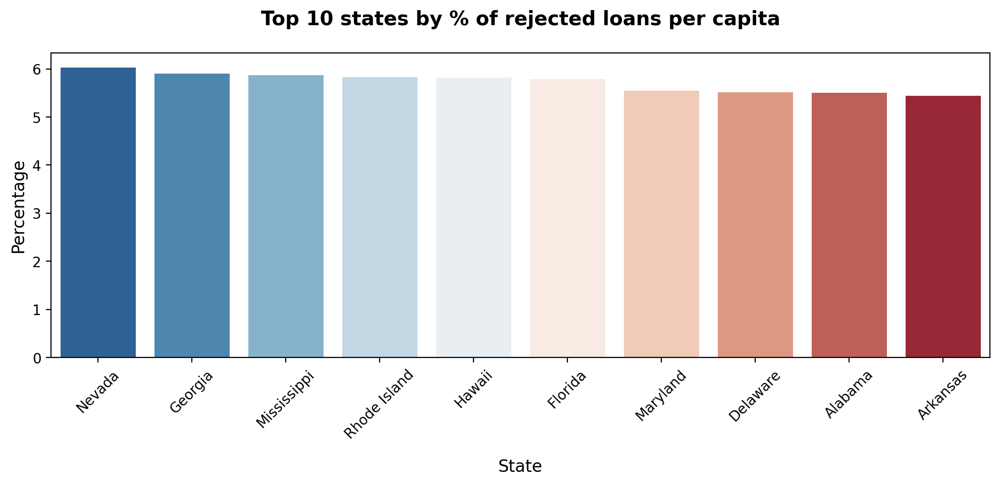

In [118]:
fig, ax = plt.subplots(figsize=(12, 4))

sns.barplot(
    x="state_long",
    y="rejected_%_of_pop",
    data=loans_by_state.nlargest(10, columns="rejected_%_of_pop"),
    palette="RdBu_r",
)

set_labels(
    ax,
    "top 10 states by % of rejected loans per capita",
    "state",
    "percentage",
)

plt.xticks(rotation=45)
plt.show()

In [119]:
fig = px.choropleth(
    loans_by_state,
    locations="state",
    locationmode="USA-states",
    scope="usa",
    color="rejected_%_of_pop",
    color_continuous_scale="RdBu",
    hover_name="state_long",
    hover_data={"state": False},
)

fig.update_layout(
    title_text="% of rejected loans per capita by state (2017-2018)",
    #       title_font_family="Times New Roman",
    title_font_size=22,
    title_font_color="black",
    title_x=0.45,
    dragmode=False,
)

fig.show()

In [120]:
top_rejected_states = loans_by_state.nlargest(10, columns="rejected_%_of_pop")[
    "state_long"
].to_list()

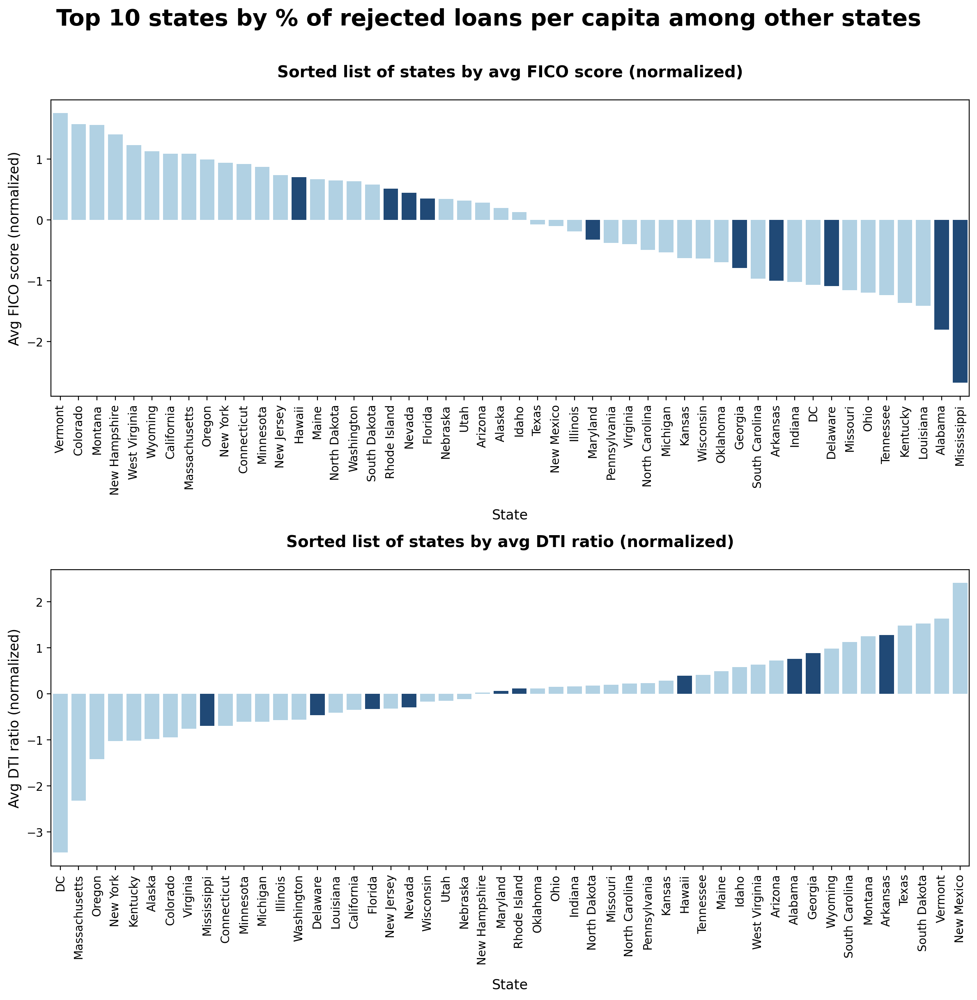

In [121]:
fig, ax = plt.subplots(2, 1, figsize=(12, 12))
fig.suptitle(
    "Top 10 states by % of rejected loans per capita among other states",
    fontsize=20,
    fontweight="semibold",
    y=1.01,
)

plot_avg_by_state(ax[0], "avg_fico", sorted_fico_by_state, top_rejected_states)
plot_avg_by_state(ax[1], "avg_dti", sorted_dti_by_state, top_rejected_states)

plt.tight_layout()
plt.show()

**Insights**

- Listing states by the mean `fico_score` and mean `dti_ratio`, it is notable that top states by percentage of rejected loans per capita have lower `mean_fico` score. 
- The relationship between percentage of rejected loans per capita in state and `dti_ratio` is not evident - no obvious pattern could be observed.